In [ ]:

#cell 1

# Install dependencies (only first time, then comment out)
#!pip install pandas numpy scikit-learn matplotlib seaborn shap lime wordcloud

# Imports
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
import shap
import lime
from lime.lime_text import LimeTextExplainer

# Display setup
sns.set(style="whitegrid", palette="muted", font_scale=1.2)
plt.rcParams["figure.figsize"] = (10, 5)


In [ ]:
#cell 2
# Path to your RMHD dataset folder
data_path = "./data/rmhd"

# Example: Load ADHD dataset (we can later merge others)
df = pd.read_csv(os.path.join(data_path, "adhd_2019_features_tfidf_256.csv"))

# Quick look
print(df.head())
print(df.info())

# Check missing values
print(df.isnull().sum())


  subreddit              author        date  \
0      adhd               slpgh  2019/01/01   
1      adhd  -Warrior_Princess-  2019/01/01   
2      adhd  VeryOriginalName98  2019/01/01   
3      adhd      sleepy_sloth_1  2019/01/01   
4      adhd   TheBulgarianBrute  2019/01/01   

                                                post  \
0  Has anyone tried the GeneSight genetic test fo...   
1  I was doing so well... I was diagnosed back in...   
2  Is it possible to have ADHD and not typically ...   
3  Is it possible to treat ADD, anxiety, and depr...   
4  Everything seems very complicated. I was diagn...   

   automated_readability_index  coleman_liau_index  \
0                     7.221590            7.911672   
1                     3.425192            5.891336   
2                     5.034505            7.626343   
3                     1.902496            3.581086   
4                     5.888431            6.327416   

   flesch_kincaid_grade_level  flesch_reading_ease  gul

In [ ]:
#cell 3
# Keep only text + label
df = df.dropna(subset=['post', 'subreddit'])
df['post'] = df['post'].astype(str).str.strip()

print("After cleaning:", df.shape)
print(df[['subreddit', 'post']].head())


After cleaning: (10223, 350)
  subreddit                                               post
0      adhd  Has anyone tried the GeneSight genetic test fo...
1      adhd  I was doing so well... I was diagnosed back in...
2      adhd  Is it possible to have ADHD and not typically ...
3      adhd  Is it possible to treat ADD, anxiety, and depr...
4      adhd  Everything seems very complicated. I was diagn...


In [ ]:
#cell 4

import pandas as pd
import glob
import os

# Correct base path
path = r"C:\Users\ankit\Desktop\Mental Health\data\rmhd"

# Find only ADHD CSVs
adhd_files = glob.glob(os.path.join(path, "adhd*.csv"))
print("ADHD files found:", adhd_files)

# Read and merge
df_list = []
for file in adhd_files:
    try:
        temp = pd.read_csv(file)
        temp["source_file"] = os.path.basename(file)  # keep track of source
        df_list.append(temp)
    except Exception as e:
        print(f"⚠️ Error reading {file}: {e}")

if df_list:
    adhd_df = pd.concat(df_list, ignore_index=True)
    print("Final ADHD dataframe shape:", adhd_df.shape)
    print("Columns:", adhd_df.columns.tolist()[:15], "...")  # preview columns
else:
    print("⚠️ No ADHD CSVs were loaded")


ADHD files found: ['C:\\Users\\ankit\\Desktop\\Mental Health\\data\\rmhd\\adhd_2018_features_tfidf_256.csv', 'C:\\Users\\ankit\\Desktop\\Mental Health\\data\\rmhd\\adhd_2019_features_tfidf_256.csv', 'C:\\Users\\ankit\\Desktop\\Mental Health\\data\\rmhd\\adhd_post_features_tfidf_256.csv', 'C:\\Users\\ankit\\Desktop\\Mental Health\\data\\rmhd\\adhd_pre_features_tfidf_256.csv']
Final ADHD dataframe shape: (45631, 351)
Columns: ['subreddit', 'author', 'date', 'post', 'automated_readability_index', 'coleman_liau_index', 'flesch_kincaid_grade_level', 'flesch_reading_ease', 'gulpease_index', 'gunning_fog_index', 'lix', 'smog_index', 'wiener_sachtextformel', 'n_chars', 'n_long_words'] ...


In [ ]:
#cell 5

import os
import glob
import pandas as pd

# Path to rmhd folder
data_path = r"C:\Users\ankit\Desktop\Mental Health\data\rmhd"

# Find all CSV files
all_files = glob.glob(os.path.join(data_path, "*.csv"))
print("Total CSV files found:", len(all_files))

df_list = []

for file in all_files:
    try:
        # disorder = first part of filename before "_"
        disorder = os.path.basename(file).split("_")[0].lower()
        
        temp = pd.read_csv(file)
        temp["source_file"] = os.path.basename(file)
        temp["disorder"] = disorder  # add label
        df_list.append(temp)

    except Exception as e:
        print(f"⚠️ Error reading {file}: {e}")

# Merge everything
if df_list:
    full_df = pd.concat(df_list, ignore_index=True)
    print("Final merged dataframe shape:", full_df.shape)
    print("Disorders present:", full_df["disorder"].unique())
else:
    print("⚠️ No CSVs merged. Check file path and naming pattern.")


Total CSV files found: 108
Final merged dataframe shape: (1107302, 352)
Disorders present: ['addiction' 'adhd' 'alcoholism' 'anxiety' 'autism' 'bipolarreddit' 'bpd'
 'conspiracy' 'covid19' 'depression' 'divorce' 'edanonymous' 'fitness'
 'guns' 'healthanxiety' 'jokes' 'legaladvice' 'lonely' 'meditation'
 'mentalhealth' 'parenting' 'personalfinance' 'ptsd' 'relationships'
 'schizophrenia' 'socialanxiety' 'suicidewatch' 'teaching']


In [ ]:
#cell 6

# List of relevant disorders
relevant_disorders = [
    "adhd", "autism",
    "addiction", "alcoholism", "anxiety", "healthanxiety", "socialanxiety",
    "bipolarreddit", "bpd", "depression", "ptsd",
    "schizophrenia", "suicidewatch", "lonely", "mentalhealth"
]

filtered_df = full_df[full_df["disorder"].isin(relevant_disorders)].reset_index(drop=True)

print("Filtered dataset shape:", filtered_df.shape)
print("Disorders kept:", filtered_df["disorder"].unique())


Filtered dataset shape: (457255, 352)
Disorders kept: ['addiction' 'adhd' 'alcoholism' 'anxiety' 'autism' 'bipolarreddit' 'bpd'
 'depression' 'healthanxiety' 'lonely' 'mentalhealth' 'ptsd'
 'schizophrenia' 'socialanxiety' 'suicidewatch']


In [ ]:
#cell 7

import pandas as pd

# Load your merged dataset
df = pd.read_csv("merged_dataset.csv")

# ✅ Relevant disorder categories we want to keep
relevant_disorders = [
    "addiction", "adhd", "alcoholism", "anxiety", "autism", 
    "bipolarreddit", "bpd", "depression", "healthanxiety", 
    "lonely", "mentalhealth", "ptsd", "schizophrenia", 
    "socialanxiety", "suicidewatch"
]

# ✅ Use 'label' instead of 'subreddit'
df_filtered = df[df["label"].isin(relevant_disorders)].copy()

# ✅ Reset index for cleanliness
df_filtered.reset_index(drop=True, inplace=True)

# ✅ Save filtered dataset
df_filtered.to_csv("filtered_dataset.csv", index=False)

print("✅ Filtering complete. New shape:", df_filtered.shape)
print("✅ Unique labels:", df_filtered['label'].unique())


✅ Filtering complete. New shape: (457255, 352)
✅ Unique labels: ['addiction' 'adhd' 'alcoholism' 'anxiety' 'autism' 'bipolarreddit' 'bpd'
 'depression' 'healthanxiety' 'lonely' 'mentalhealth' 'ptsd'
 'schizophrenia' 'socialanxiety' 'suicidewatch']


Dataset Shape: (457255, 352)

Column Names: ['label', 'author', 'date', 'post', 'automated_readability_index', 'coleman_liau_index', 'flesch_kincaid_grade_level', 'flesch_reading_ease', 'gulpease_index', 'gunning_fog_index', 'lix', 'smog_index', 'wiener_sachtextformel', 'n_chars', 'n_long_words', 'n_monosyllable_words', 'n_polysyllable_words', 'n_sents', 'n_syllables', 'n_unique_words', 'n_words', 'sent_neg', 'sent_neu', 'sent_pos', 'sent_compound', 'economic_stress_total', 'isolation_total', 'substance_use_total', 'guns_total', 'domestic_stress_total', 'suicidality_total', 'punctuation', 'liwc_1st_pers', 'liwc_2nd_pers', 'liwc_3rd_pers', 'liwc_achievement', 'liwc_adverbs', 'liwc_affective_processes', 'liwc_anger', 'liwc_anxiety', 'liwc_articles_article', 'liwc_assent', 'liwc_auxiliary_verbs', 'liwc_biological', 'liwc_body', 'liwc_causation', 'liwc_certainty', 'liwc_cognitive', 'liwc_common_verbs', 'liwc_conjunctions', 'liwc_death', 'liwc_discrepancy', 'liwc_exclusive', 'liwc_family', 

C:\Users\ankit\AppData\Local\Temp\ipykernel_21904\2977070673.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x="label", order=df["label"].value_counts().index, palette="viridis")


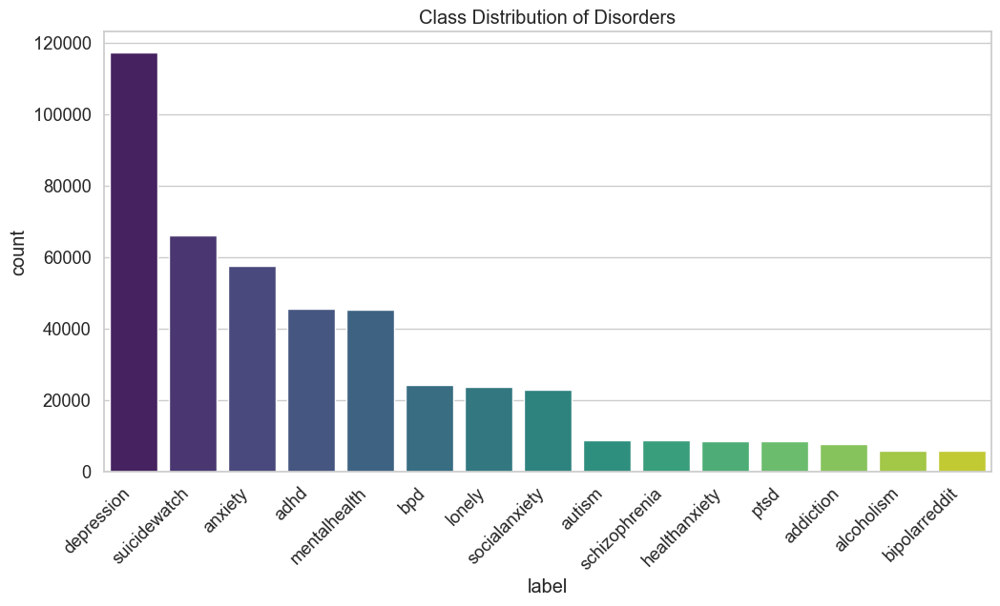

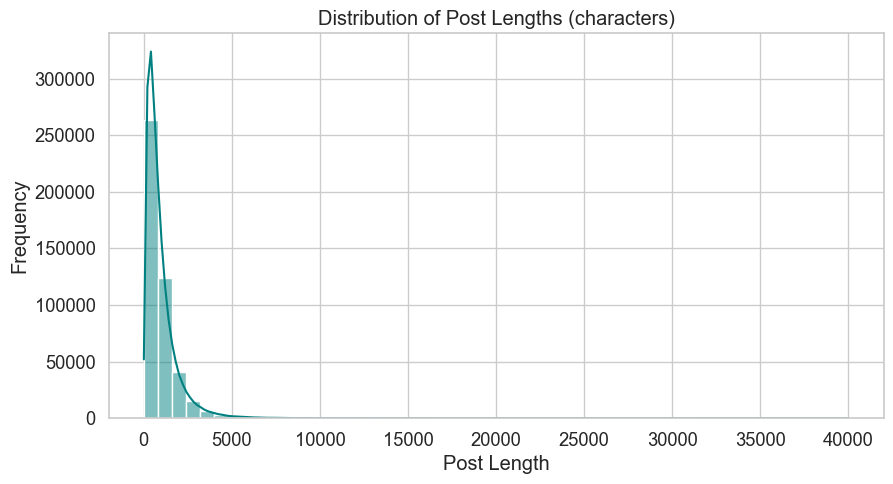

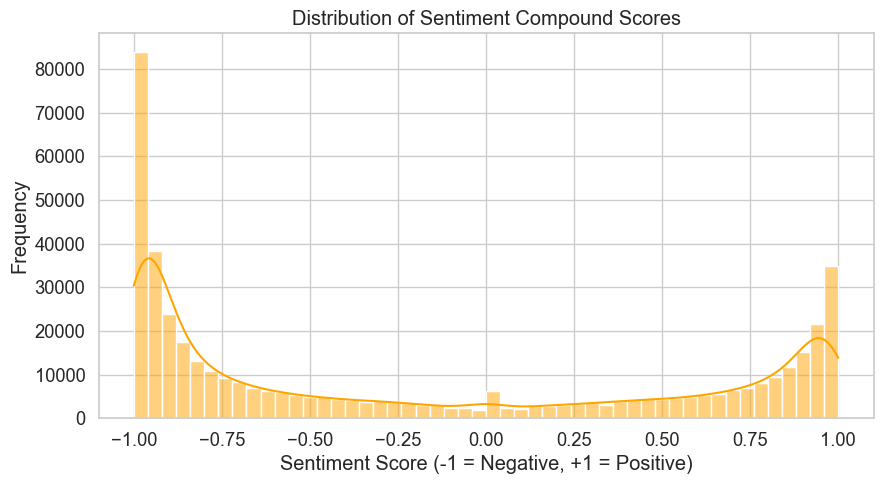

C:\Users\ankit\AppData\Local\Temp\ipykernel_21904\2977070673.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='label', y='sent_compound', palette="coolwarm")


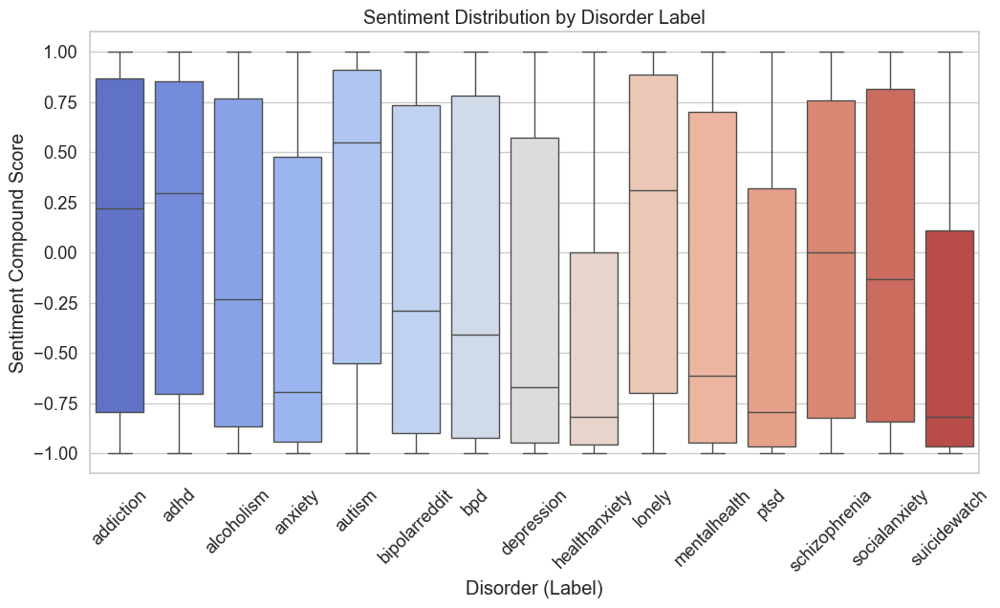

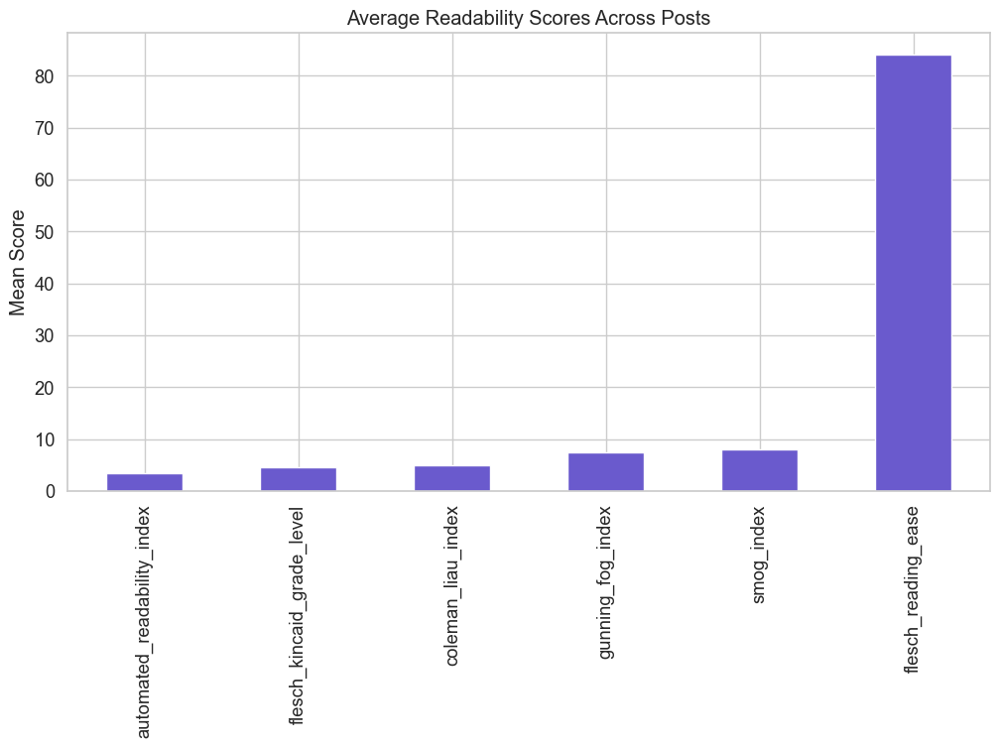

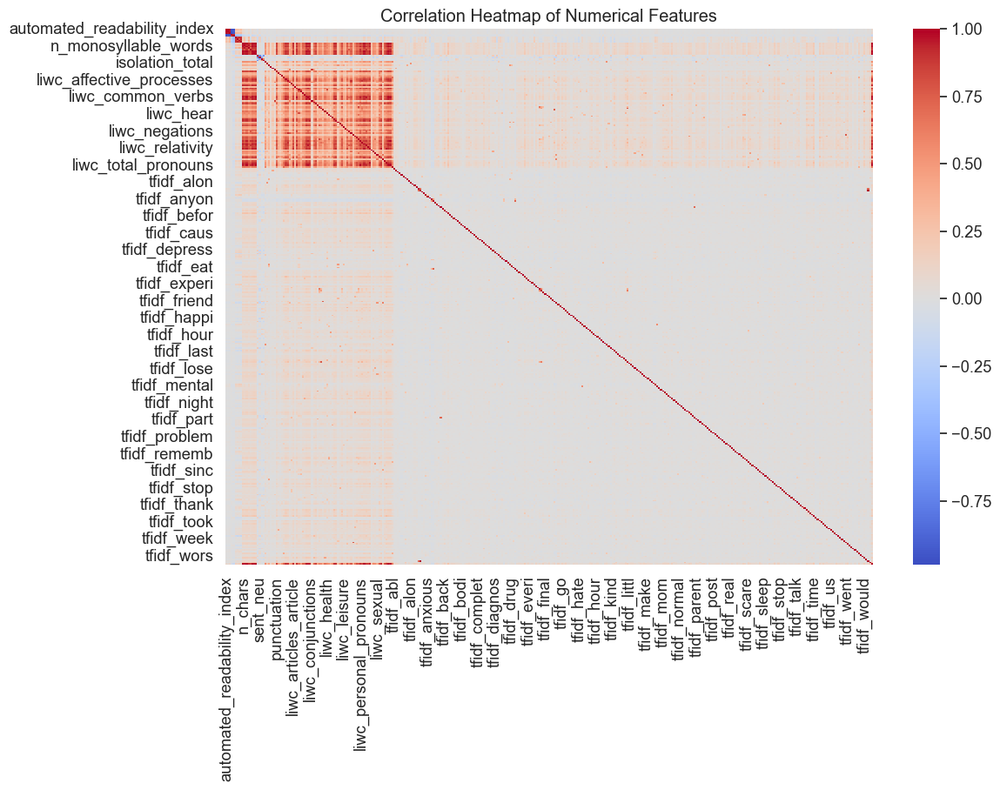

C:\Users\ankit\AppData\Local\Temp\ipykernel_21904\2977070673.py:95: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='label', y='word_count', palette="Set2")


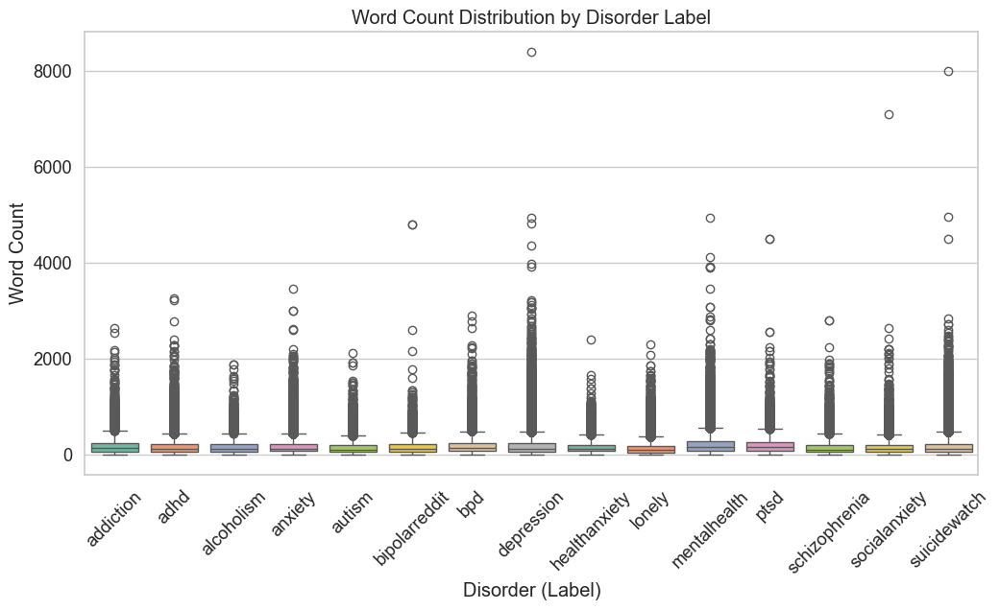

In [ ]:
#cell 8

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------------
# Load dataset
# -----------------------------------
df = pd.read_csv("filtered_dataset.csv")

# -----------------------------------
# 1. Basic Info
# -----------------------------------
print("Dataset Shape:", df.shape)
print("\nColumn Names:", df.columns.tolist())
print("\nMissing Values:\n", df.isnull().sum().sort_values(ascending=False).head(10))

# ✅ Use 'label' for categories
print("\nDisorder Categories:", df['label'].unique())

# -----------------------------------
# 2. Class distribution
# -----------------------------------
plt.figure(figsize=(12,6))
sns.countplot(data=df, x="label", order=df["label"].value_counts().index, palette="viridis")
plt.xticks(rotation=45, ha="right")
plt.title("Class Distribution of Disorders")
plt.show()

# -----------------------------------
# 3. Post length distribution
# -----------------------------------
df['post_length'] = df['post'].astype(str).apply(len)

plt.figure(figsize=(10,5))
sns.histplot(df['post_length'], bins=50, kde=True, color="teal")
plt.title("Distribution of Post Lengths (characters)")
plt.xlabel("Post Length")
plt.ylabel("Frequency")
plt.show()

# -----------------------------------
# 4. Sentiment score distribution
# (Only if 'sent_compound' exists)
# -----------------------------------
if 'sent_compound' in df.columns:
    plt.figure(figsize=(10,5))
    sns.histplot(df['sent_compound'], bins=50, kde=True, color="orange")
    plt.title("Distribution of Sentiment Compound Scores")
    plt.xlabel("Sentiment Score (-1 = Negative, +1 = Positive)")
    plt.ylabel("Frequency")
    plt.show()

    plt.figure(figsize=(12,6))
    sns.boxplot(data=df, x='label', y='sent_compound', palette="coolwarm")
    plt.xticks(rotation=45)
    plt.title("Sentiment Distribution by Disorder Label")
    plt.xlabel("Disorder (Label)")
    plt.ylabel("Sentiment Compound Score")
    plt.show()

# -----------------------------------
# 5. Readability index distribution
# -----------------------------------
readability_cols = [
    'automated_readability_index', 'coleman_liau_index', 'flesch_kincaid_grade_level',
    'flesch_reading_ease', 'gunning_fog_index', 'smog_index'
]

available_readability = [col for col in readability_cols if col in df.columns]

if available_readability:
    plt.figure(figsize=(12,6))
    df[available_readability].mean().sort_values().plot(kind="bar", color="slateblue")
    plt.title("Average Readability Scores Across Posts")
    plt.ylabel("Mean Score")
    plt.show()

# -----------------------------------
# 6. Correlation heatmap for numerical features
# -----------------------------------
num_cols = df.select_dtypes(include=['float64','int64']).columns
corr = df[num_cols].corr()

plt.figure(figsize=(12,8))
sns.heatmap(corr, cmap="coolwarm", center=0)
plt.title("Correlation Heatmap of Numerical Features")
plt.show()

# -----------------------------------
# 7. Example word count per category
# -----------------------------------
df['word_count'] = df['post'].astype(str).apply(lambda x: len(x.split()))

plt.figure(figsize=(12,6))
sns.boxplot(data=df, x='label', y='word_count', palette="Set2")
plt.xticks(rotation=45)
plt.title("Word Count Distribution by Disorder Label")
plt.xlabel("Disorder (Label)")
plt.ylabel("Word Count")
plt.show()


In [ ]:
#cell 9

import pandas as pd

# Load CSV
df = pd.read_csv("filtered_dataset.csv")
print("Dataset shape:", df.shape)
print("Class distribution:\n", df['label'].value_counts())


Dataset shape: (457255, 352)
Class distribution:
 label
depression       117331
suicidewatch      66161
anxiety           57671
adhd              45631
mentalhealth      45332
bpd               24294
lonely            23635
socialanxiety     22996
autism             8869
schizophrenia      8712
healthanxiety      8648
ptsd               8643
addiction          7641
alcoholism         5911
bipolarreddit      5780
Name: count, dtype: int64


In [ ]:
#cell 10

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    df['post'], df['label'], test_size=0.2, random_state=42, stratify=df['label']
)
print("Train size:", X_train.shape[0], "| Test size:", X_test.shape[0])


Train size: 365804 | Test size: 91451


In [ ]:
#cell 11

from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(max_features=5000, stop_words='english')
X_train_vec = vectorizer.fit_transform(X_train)
X_test_vec = vectorizer.transform(X_test)
print("TF-IDF vectorization done. Feature shape:", X_train_vec.shape)


TF-IDF vectorization done. Feature shape: (365804, 5000)


In [ ]:
#cell 12

from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)
y_test_enc = le.transform(y_test)

print("Label mapping:", dict(zip(le.classes_, le.transform(le.classes_))))


Label mapping: {'addiction': np.int64(0), 'adhd': np.int64(1), 'alcoholism': np.int64(2), 'anxiety': np.int64(3), 'autism': np.int64(4), 'bipolarreddit': np.int64(5), 'bpd': np.int64(6), 'depression': np.int64(7), 'healthanxiety': np.int64(8), 'lonely': np.int64(9), 'mentalhealth': np.int64(10), 'ptsd': np.int64(11), 'schizophrenia': np.int64(12), 'socialanxiety': np.int64(13), 'suicidewatch': np.int64(14)}


In [ ]:
#cell 13

from sklearn.metrics import classification_report, accuracy_score
import time

def train_and_evaluate(model, name):
    start = time.time()
    model.fit(X_train_vec, y_train_enc)
    y_pred = model.predict(X_test_vec)
    end = time.time()
    print(f"\n{name} Report (Time: {end-start:.2f}s):")
    print(classification_report(y_test_enc, y_pred, target_names=le.classes_))
    print(f"{name} Accuracy: {accuracy_score(y_test_enc, y_pred):.4f}")
    return end - start



Logistic Regression Report (Time: 69.95s):
               precision    recall  f1-score   support

    addiction       0.79      0.70      0.74      1528
         adhd       0.84      0.87      0.85      9126
   alcoholism       0.80      0.73      0.76      1182
      anxiety       0.67      0.70      0.68     11534
       autism       0.87      0.70      0.78      1774
bipolarreddit       0.68      0.41      0.51      1156
          bpd       0.81      0.62      0.70      4859
   depression       0.56      0.71      0.63     23466
healthanxiety       0.75      0.60      0.67      1730
       lonely       0.61      0.53      0.56      4727
 mentalhealth       0.48      0.36      0.41      9067
         ptsd       0.76      0.60      0.67      1729
schizophrenia       0.72      0.55      0.63      1742
socialanxiety       0.64      0.57      0.60      4599
 suicidewatch       0.62      0.58      0.60     13232

     accuracy                           0.64     91451
    macro avg      

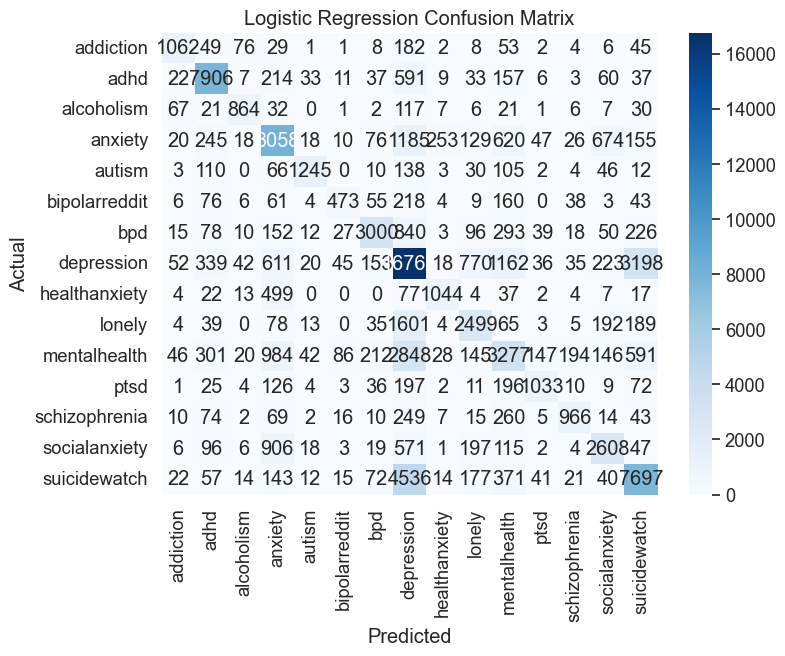

In [ ]:
#cell 14

#Logistic Regression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

log_reg = LogisticRegression(max_iter=1000, n_jobs=-1)

# Train & Evaluate
start = time.time()
log_reg.fit(X_train_vec, y_train_enc)
y_pred = log_reg.predict(X_test_vec)
end = time.time()

print(f"\nLogistic Regression Report (Time: {end-start:.2f}s):")
print(classification_report(y_test_enc, y_pred, target_names=le.classes_))
print(f"Accuracy: {accuracy_score(y_test_enc, y_pred):.4f}")

# Confusion Matrix
cm = confusion_matrix(y_test_enc, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Logistic Regression Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()



Linear SVM Report (Time: 86.33s):
               precision    recall  f1-score   support

    addiction       0.76      0.74      0.75      1528
         adhd       0.82      0.87      0.85      9126
   alcoholism       0.78      0.78      0.78      1182
      anxiety       0.67      0.71      0.69     11534
       autism       0.82      0.73      0.77      1774
bipolarreddit       0.65      0.46      0.54      1156
          bpd       0.81      0.62      0.71      4859
   depression       0.57      0.71      0.63     23466
healthanxiety       0.71      0.63      0.67      1730
       lonely       0.59      0.54      0.56      4727
 mentalhealth       0.54      0.29      0.37      9067
         ptsd       0.71      0.64      0.68      1729
schizophrenia       0.68      0.60      0.64      1742
socialanxiety       0.62      0.56      0.59      4599
 suicidewatch       0.60      0.61      0.61     13232

     accuracy                           0.64     91451
    macro avg       0.69    

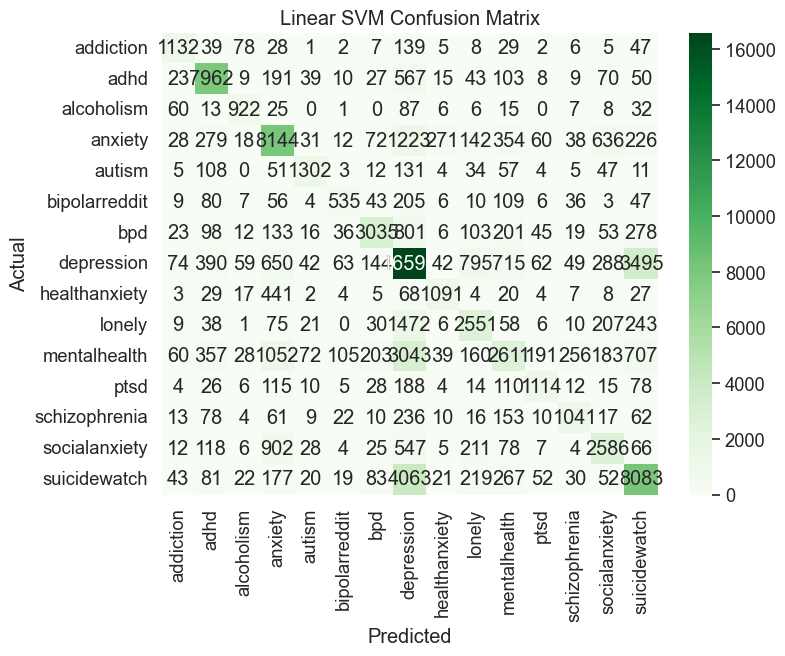

In [ ]:
#cell 15

#LinearSVC
from sklearn.svm import LinearSVC

svm = LinearSVC(max_iter=5000)

start = time.time()
svm.fit(X_train_vec, y_train_enc)
y_pred = svm.predict(X_test_vec)
end = time.time()

print(f"\nLinear SVM Report (Time: {end-start:.2f}s):")
print(classification_report(y_test_enc, y_pred, target_names=le.classes_))
print(f"Accuracy: {accuracy_score(y_test_enc, y_pred):.4f}")

cm = confusion_matrix(y_test_enc, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Linear SVM Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()



Random Forest Report (Time: 1892.13s):
               precision    recall  f1-score   support

    addiction       0.84      0.57      0.68      1528
         adhd       0.82      0.85      0.84      9126
   alcoholism       0.81      0.71      0.76      1182
      anxiety       0.67      0.72      0.70     11534
       autism       0.89      0.69      0.78      1774
bipolarreddit       0.79      0.30      0.44      1156
          bpd       0.90      0.61      0.73      4859
   depression       0.49      0.80      0.61     23466
healthanxiety       0.82      0.37      0.51      1730
       lonely       0.71      0.44      0.54      4727
 mentalhealth       0.70      0.30      0.42      9067
         ptsd       0.83      0.54      0.66      1729
schizophrenia       0.80      0.56      0.66      1742
socialanxiety       0.76      0.53      0.63      4599
 suicidewatch       0.63      0.53      0.57     13232

     accuracy                           0.63     91451
    macro avg       0.7

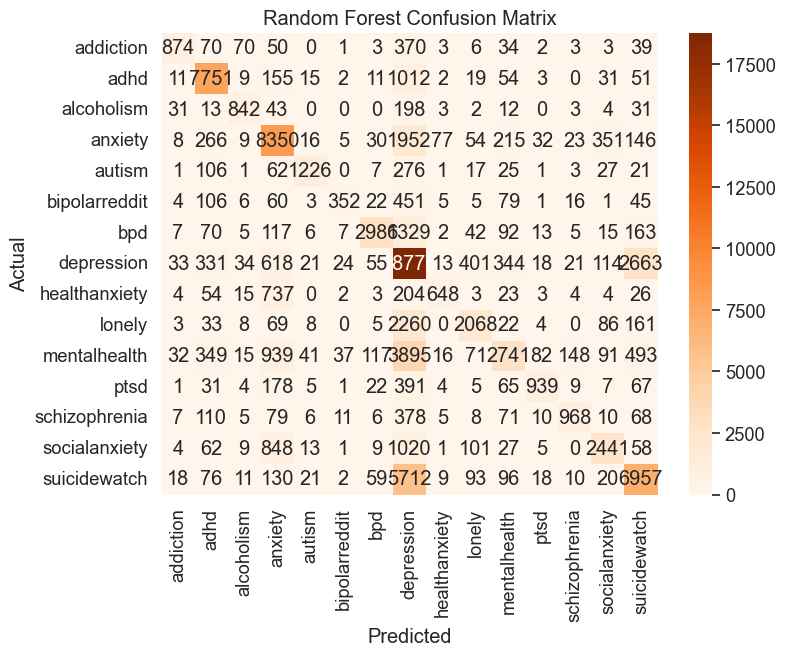

In [ ]:
#cell 16

# #Random Forest
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=200, n_jobs=-1, random_state=42)

start = time.time()
rf.fit(X_train_vec, y_train_enc)
y_pred = rf.predict(X_test_vec)
end = time.time()

print(f"\nRandom Forest Report (Time: {end-start:.2f}s):")
print(classification_report(y_test_enc, y_pred, target_names=le.classes_))
print(f"Accuracy: {accuracy_score(y_test_enc, y_pred):.4f}")

cm = confusion_matrix(y_test_enc, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Oranges', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Random Forest Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()



Random Forest Report (Time: 2391.43s):
               precision    recall  f1-score   support

    addiction       0.85      0.49      0.62      1528
         adhd       0.84      0.80      0.82      9126
   alcoholism       0.83      0.64      0.72      1182
      anxiety       0.65      0.71      0.68     11534
       autism       0.89      0.64      0.75      1774
bipolarreddit       0.80      0.17      0.28      1156
          bpd       0.89      0.56      0.69      4859
   depression       0.45      0.83      0.58     23466
healthanxiety       0.88      0.25      0.39      1730
       lonely       0.74      0.33      0.46      4727
 mentalhealth       0.68      0.23      0.34      9067
         ptsd       0.83      0.49      0.62      1729
schizophrenia       0.79      0.48      0.59      1742
socialanxiety       0.75      0.43      0.55      4599
 suicidewatch       0.64      0.48      0.55     13232

     accuracy                           0.60     91451
    macro avg       0.7

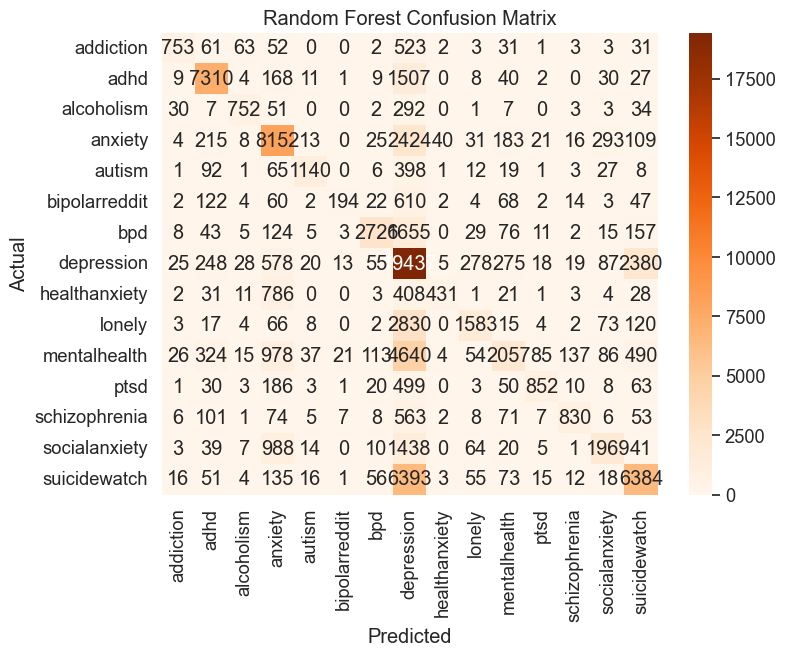

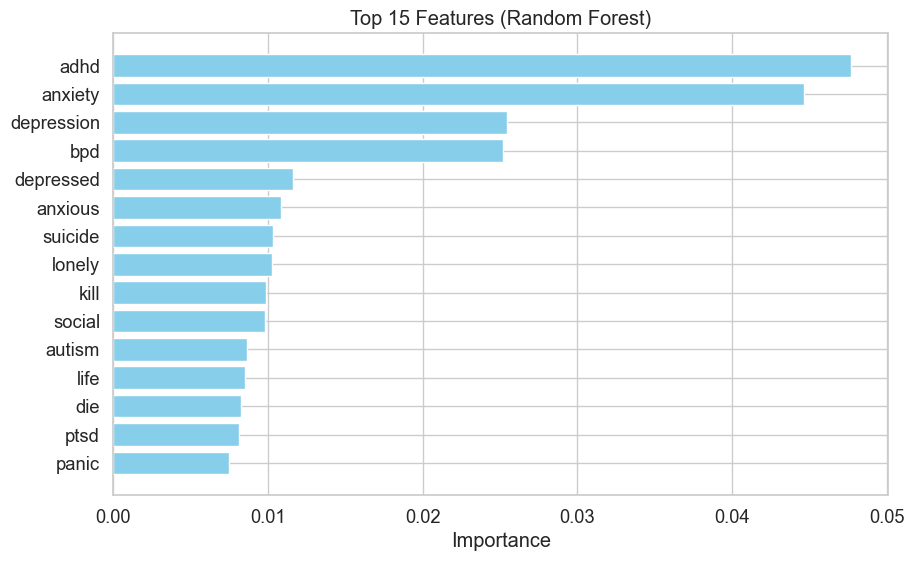

In [ ]:
#cell 16
import time
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Optimized Random Forest

rf = RandomForestClassifier(
    n_estimators=500,       # fewer trees (smaller model, faster training)
    max_depth=70,           # limit depth to avoid giant trees
    min_samples_leaf=2,     # each leaf must have ≥5 samples (reduces overfitting)
    max_features="sqrt",    # random feature subset per split (good for text data)
    n_jobs=-1,
    random_state=42
)

# Training
start = time.time()
rf.fit(X_train_vec, y_train_enc)
y_pred = rf.predict(X_test_vec)
end = time.time()

# Report
print(f"\nRandom Forest Report (Time: {end-start:.2f}s):")
print(classification_report(y_test_enc, y_pred, target_names=le.classes_))
print(f"Accuracy: {accuracy_score(y_test_enc, y_pred):.4f}")

# Confusion Matrix
cm = confusion_matrix(y_test_enc, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Oranges',
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Random Forest Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()
# Feature Importances (global)

importances = rf.feature_importances_
indices = importances.argsort()[-15:][::-1]  # top 15 features

plt.figure(figsize=(10,6))
plt.barh([vectorizer.get_feature_names_out()[i] for i in indices],
         importances[indices], color='skyblue')
plt.xlabel("Importance")
plt.title("Top 15 Features (Random Forest)")
plt.gca().invert_yaxis()
plt.show()



=== Training RF with n_estimators=600, max_depth=80 ===


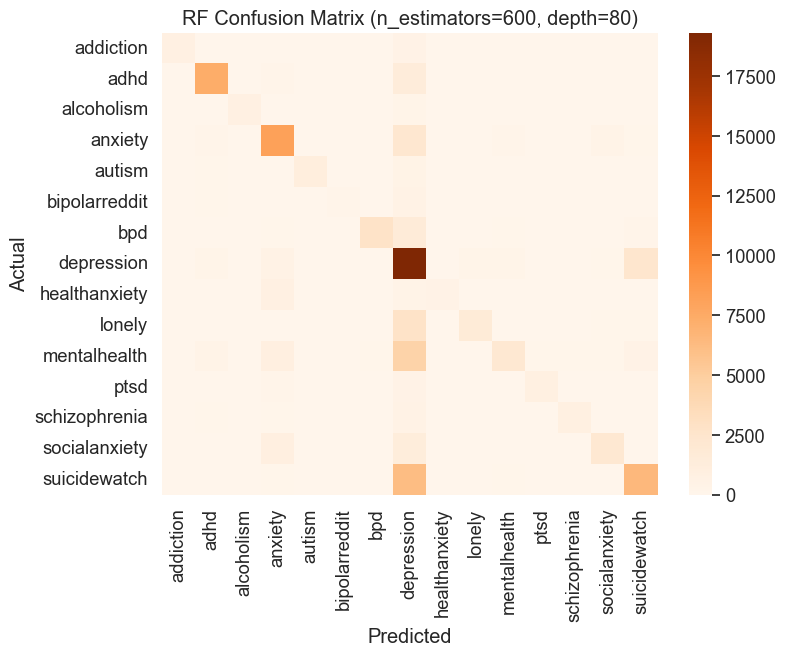


=== Training RF with n_estimators=300, max_depth=40 ===


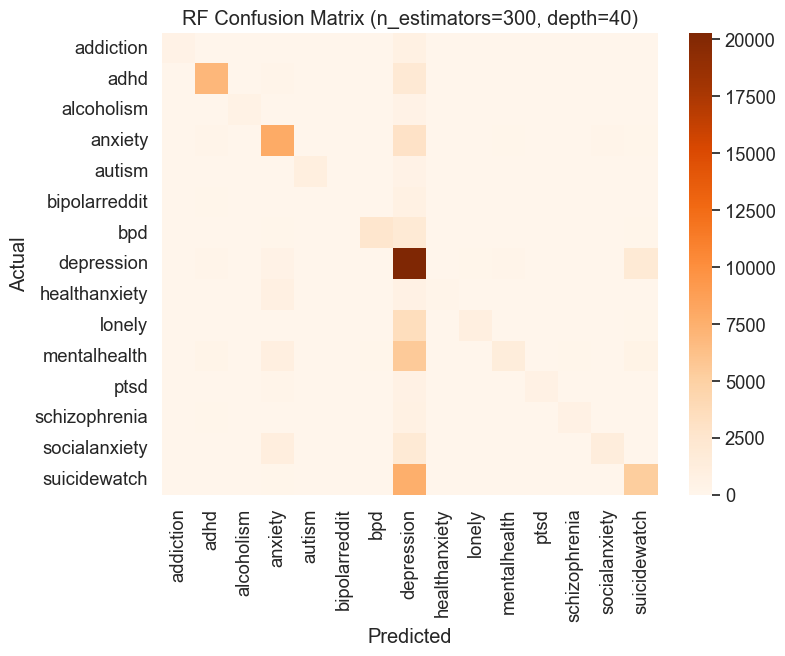


=== Training RF with n_estimators=400, max_depth=60 ===


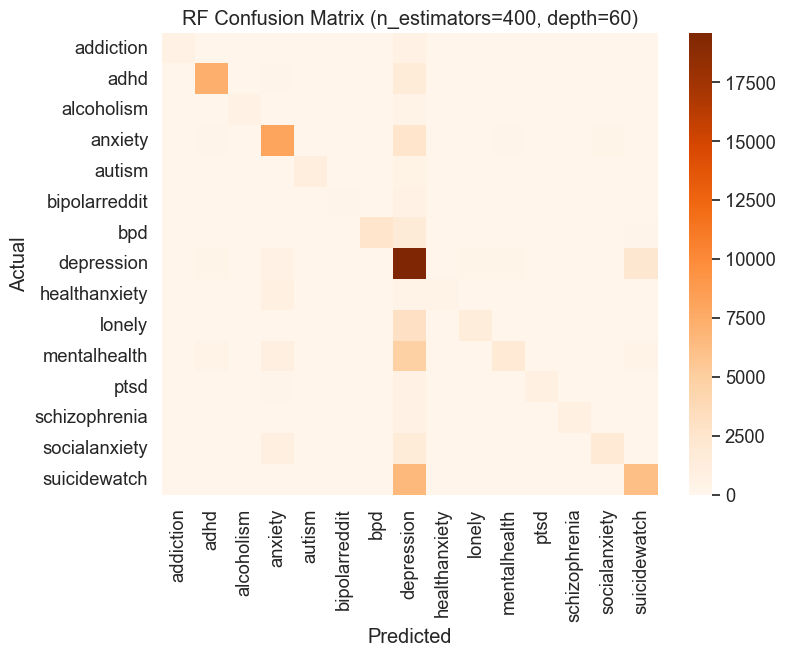


=== Benchmark Results ===
   n_estimators  max_depth  accuracy  precision    recall     time_sec  \
0           600         80  0.603197   0.767010  0.514150  2398.468174   
1           300         40  0.554155   0.785763  0.423473   454.898579   
2           400         60  0.586555   0.768959  0.483642  1144.611762   

   model_size_MB  
0    7960.875672  
1    1557.569505  
2    3969.643952  


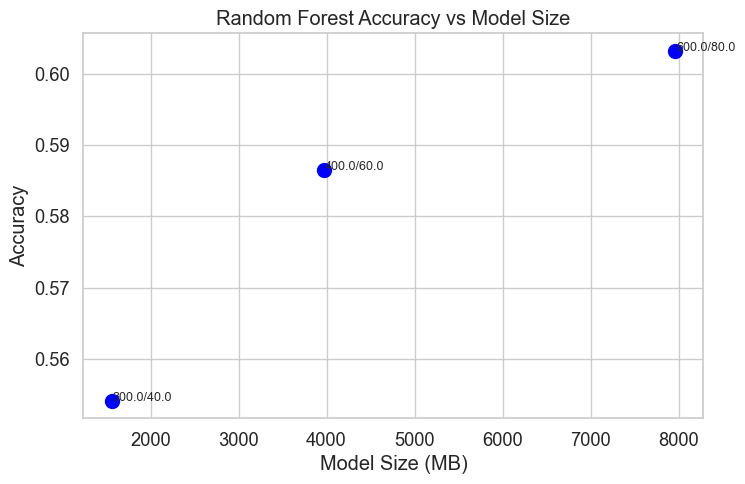

In [18]:
import time
import joblib
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Configs to test (n_estimators, max_depth)
configs = [
    (600, 80),
    (300, 40),
    (400, 60)
]

results = []

for n_estimators, max_depth in configs:
    print(f"\n=== Training RF with n_estimators={n_estimators}, max_depth={max_depth} ===")
    
    rf = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_leaf=2,
        max_features="sqrt",
        n_jobs=-1,
        random_state=42
    )
    
    start = time.time()
    rf.fit(X_train_vec, y_train_enc)
    y_pred = rf.predict(X_test_vec)
    end = time.time()
    
    acc = accuracy_score(y_test_enc, y_pred)
    report = classification_report(y_test_enc, y_pred, target_names=le.classes_, output_dict=True)
    precision = report["macro avg"]["precision"]
    recall = report["macro avg"]["recall"]
    
    # Save model
    model_path = f"rf_{n_estimators}_{max_depth}.joblib"
    joblib.dump(rf, model_path)
    
    # Get file size in MB
    import os
    size_mb = os.path.getsize(model_path) / (1024*1024)
    
    results.append({
        "n_estimators": n_estimators,
        "max_depth": max_depth,
        "accuracy": acc,
        "precision": precision,
        "recall": recall,
        "time_sec": end - start,
        "model_size_MB": size_mb
    })
    
    # Confusion matrix plot (optional for each config)
    cm = confusion_matrix(y_test_enc, y_pred)
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, annot=False, fmt='d', cmap='Oranges',
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f"RF Confusion Matrix (n_estimators={n_estimators}, depth={max_depth})")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

# Put results into DataFrame for easy comparison
df_results = pd.DataFrame(results)
print("\n=== Benchmark Results ===")
print(df_results)

# Plot accuracy vs model size
plt.figure(figsize=(8,5))
plt.scatter(df_results["model_size_MB"], df_results["accuracy"], s=100, c="blue")
for i, row in df_results.iterrows():
    plt.text(row["model_size_MB"]+10, row["accuracy"], 
             f"{row['n_estimators']}/{row['max_depth']}", fontsize=9)
plt.xlabel("Model Size (MB)")
plt.ylabel("Accuracy")
plt.title("Random Forest Accuracy vs Model Size")
plt.show()


In [ ]:
#cell 17

import joblib

# rf -> Random Forest
# svm -> Linear SVM
# log_reg -> Logistic Regression
# vectorizer -> TF-IDF Vectorizer
# le -> Label Encoder

# Save the models and vectorizer
joblib.dump(rf, "random_forest_model.pkl")
joblib.dump(svm, "linear_svm_model.pkl")
joblib.dump(log_reg, "logistic_regression_model.pkl")
joblib.dump(vectorizer, "tfidf_vectorizer.pkl")
joblib.dump(le, "label_encoder.pkl")

print("All models and encoders have been saved successfully!")


All models and encoders have been saved successfully!


In [ ]:
#Cell 1

import pandas as pd
import numpy as np
import joblib
import shap
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer

# Load Models and Vectorizer
print("Loading models and vectorizer...")

rf = joblib.load("random_forest_model.pkl")
svm = joblib.load("linear_svm_model.pkl")
log_reg = joblib.load("logistic_regression_model.pkl")
vectorizer = joblib.load("tfidf_vectorizer.pkl")

print("Models and vectorizer loaded successfully!")

# Load Dataset for reference
print("Loading dataset...")

df = pd.read_csv("filtered_dataset.csv")

print("Dataset loaded successfully!")
print("Dataset shape:", df.shape)


Loading models and vectorizer...


c:\Users\ankit\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:442: InconsistentVersionWarning: Trying to unpickle estimator DecisionTreeClassifier from version 1.7.0 when using version 1.7.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\ankit\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:442: InconsistentVersionWarning: Trying to unpickle estimator RandomForestClassifier from version 1.7.0 when using version 1.7.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\ankit\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:442: InconsistentVersionWarning: Trying to 

Models and vectorizer loaded successfully!
Loading dataset...
Dataset loaded successfully!
Dataset shape: (457255, 352)


In [ ]:
#Cell 2
import matplotlib.pyplot as plt
import numpy as np
import shap

# Mapping numeric class to mental health condition names
class_mapping = {
    0: "addiction", 1: "adhd", 2: "alcoholism", 3: "anxiety", 4: "autism",
    5: "bipolarreddit", 6: "bpd", 7: "depression", 8: "healthanxiety", 9: "lonely",
    10: "mentalhealth", 11: "ptsd", 12: "schizophrenia", 13: "socialanxiety", 14: "suicidewatch"
}

def explain_prediction(input_text):
    X_input = vectorizer.transform([input_text])
    feature_names = vectorizer.get_feature_names_out()

    # Prediction probabilities
    prob_rf = rf.predict_proba(X_input)[0]
    prob_log = log_reg.predict_proba(X_input)[0]
    prob_svm = np.zeros_like(prob_rf)
    try:
        prob_svm = svm.predict_proba(X_input)[0]
    except:
        prob_svm = np.zeros_like(prob_rf)
    
    # Select best model
    max_rf, max_log, max_svm = np.max(prob_rf), np.max(prob_log), np.max(prob_svm)
    best_model_name, best_model, best_probs = "Random Forest", rf, prob_rf
    if max_log > max_rf and max_log >= max_svm:
        best_model_name, best_model, best_probs = "Logistic Regression", log_reg, prob_log
    elif max_svm > max_rf and max_svm >= max_log:
        best_model_name, best_model, best_probs = "Linear SVM", svm, prob_svm
    
    # Prediction and probabilities

    pred_idx = np.argmax(best_probs)
    pred_class = best_model.classes_[pred_idx]
    pred_name = class_mapping[pred_class]
    pred_score = best_probs[pred_idx] * 100
    
    # Named probabilities sorted
    named_probs = {class_mapping[k]: float(v) for k, v in zip(best_model.classes_, best_probs)}
    named_probs_sorted = dict(sorted(named_probs.items(), key=lambda x: x[1], reverse=True))
    
    print(f"Best Model Used: {best_model_name}")
    print(f"Predicted Condition: {pred_name} ({pred_score:.2f}%)")
    print("Prediction Probabilities (top 5):")
    for cls, prob in list(named_probs_sorted.items())[:5]:
        marker = "<-- Main Prediction" if cls == pred_name else ""
        print(f"  {cls}: {prob:.3f} {marker}")
 
    # Feature-level explanation
    # ------------------------
    top_n = 10  # Top N features
    nonzero_idx = X_input.nonzero()[1]
    if len(nonzero_idx) == 0:
        print("No meaningful features found for explanation.")
        return

    # Random Forest
    if best_model_name == "Random Forest":
        # --- Local Explanation (using feature importances instead of SHAP) ---
        importances = best_model.feature_importances_

        # Pick only the nonzero features from the input
        local_importances = importances[nonzero_idx]

        n_top = min(top_n, len(nonzero_idx))
        top_idx = np.argsort(local_importances)[-n_top:]

        top_features = feature_names[nonzero_idx][top_idx]
        top_values = local_importances[top_idx]

        # Bar plot (per-input)
        plt.figure(figsize=(10, 6))
        plt.barh(top_features[::-1], top_values[::-1], color="skyblue")
        plt.xlabel("Feature Importance (local input)")
        plt.title(f"Top Features contributing to '{pred_name}' (Random Forest, Feature Importance)")
        plt.show()

        # --- Global Explanation (overall feature importances) ---
        global_importances = best_model.feature_importances_
        n_top_heat = 10
        top_features_idx = np.argsort(global_importances)[-n_top_heat:]
        top_features_global = feature_names[top_features_idx]
        top_values_global = global_importances[top_features_idx]

        plt.figure(figsize=(10, 6))
        plt.imshow(
            np.tile(top_values_global, (len(best_model.classes_), 1)),
            cmap="coolwarm",
            aspect="auto"
        ) 
        plt.xticks(range(n_top_heat), top_features_global, rotation=45, ha="right")
        plt.yticks(range(len(best_model.classes_)), [class_mapping[c] for c in best_model.classes_])
        plt.colorbar(label="Feature Importance")
        plt.title("Global Feature Importances Across All Classes (Random Forest)")
        plt.show()

    # Logistic Regression / Linear SVM
    else:
        coefs = best_model.coef_
        shap_vals = coefs[pred_idx, nonzero_idx]
        n_top = min(top_n, len(nonzero_idx))
        top_idx = np.argsort(np.abs(shap_vals))[-n_top:]
        top_features = feature_names[nonzero_idx][top_idx]
        top_values = shap_vals[top_idx]
        
        # Bar plot (per-input)
        plt.figure(figsize=(10, 6))
        colors = ['green' if v > 0 else 'red' for v in top_values]
        plt.barh(top_features[::-1], top_values[::-1], color=colors)
        plt.xlabel("Feature Contribution")
        plt.title(f"Top Features contributing to '{pred_name}' ({best_model_name})")
        plt.show()
        
        # Heatmap (global coefficients across classes)
        all_coefs = coefs[:, nonzero_idx]
        n_top_heat = min(top_n, all_coefs.shape[1])
        top_features_idx = np.argsort(np.abs(all_coefs).mean(axis=0))[-n_top_heat:]
        plt.figure(figsize=(10, 6))
        plt.imshow(all_coefs[:, top_features_idx], cmap="coolwarm", aspect="auto")
        plt.xticks(range(n_top_heat), feature_names[nonzero_idx][top_features_idx], rotation=45, ha="right")
        plt.yticks(range(len(best_model.classes_)), [class_mapping[c] for c in best_model.classes_])
        plt.colorbar(label="Feature Contribution")
        plt.title(f"Feature Contributions Across All Classes ({best_model_name})")
        plt.show()
    
    # ------------------------
    # Summary
    # ------------------------
    summary_text = f"\nBased on the input text, the model predicts '{pred_name}' with {pred_score:.2f}% confidence.\nTop contributing words/features: {', '.join(top_features[::-1])}"
    print(summary_text)


In [ ]:

#Cell 3

# Final explain_prediction (no SHAP text-mask errors)
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from lime.lime_text import LimeTextExplainer
from IPython.display import display, HTML

# models must already exist in the session:
models = {"Logistic Regression": log_reg, "Linear SVM": svm, "Random Forest": rf}
# class_mapping must exist (index -> name)
class_names_all = [class_mapping[i] for i in sorted(class_mapping.keys())]

def explain_prediction(input_text, top_n=12, show_plots=True):
    """
    Single-call explain function:
     - auto-selects best model by max probability,
     - for LR / Linear SVM: exact linear contributions (coef * tfidf) + LIME,
     - for Random Forest: local/global feature_importances + LIME (no SHAP).
    Requires: vectorizer, log_reg, svm, rf, class_mapping in globals.
    """
    # Vectorize
    X_input = vectorizer.transform([input_text])
    feature_names = vectorizer.get_feature_names_out()

    # 1) Choose best model by highest max probability
    best_model_name = None
    best_model = None
    best_probs = None
    best_score = -1.0
    for name, m in models.items():
        try:
            probs = m.predict_proba(X_input)[0]
        except Exception:
            probs = np.zeros(len(class_mapping))
        score = float(np.max(probs))
        if score > best_score:
            best_score = score
            best_model_name = name
            best_model = m
            best_probs = probs

    if best_model is None:
        print("No model available to predict.")
        return

    # Map model classes -> global labels
    model_classes = list(best_model.classes_.astype(int))
    model_class_names = [class_mapping[int(c)] for c in model_classes]

    # Predicted class (index relative to model.classes_)
    pred_idx_in_model = int(np.argmax(best_probs))
    pred_global_idx = int(best_model.classes_[pred_idx_in_model])
    pred_name = class_mapping[pred_global_idx]
    pred_score = best_probs[pred_idx_in_model]

    # Output basic info & probabilities
    print("="*90)
    print("Input (trim):", (input_text[:260] + "...") if len(input_text)>260 else input_text)
    print("Best model:", best_model_name)
    print(f"Predicted: {pred_name}  (confidence = {pred_score:.4f})")
    print("\nTop probabilities (model order):")
    order = np.argsort(best_probs)[::-1]
    for i in order[:10]:
        gname = class_mapping[int(best_model.classes_[i])]
        mark = "<-- predicted" if i == pred_idx_in_model else ""
        print(f"  {gname:25s} {best_probs[i]:.4f} {mark}")

    # probability bar chart
    if show_plots:
        plt.figure(figsize=(9,6))
        sns.barplot(x=best_probs[order], y=[class_mapping[int(best_model.classes_[i])] for i in order], palette="viridis")
        plt.xlabel("Probability")
        plt.title(f"Prediction probabilities ({best_model_name})")
        plt.show()

    # local predict wrapper for LIME
    def predict_proba_for_lime(texts):
        return best_model.predict_proba(vectorizer.transform(texts))

    # ---------------- Random Forest branch ----------------
    if best_model_name == "Random Forest":
        print("\n-- Random Forest explanation (no SHAP). Using feature_importances_ + LIME.")

        # Local importances for features present in this input
        importances = best_model.feature_importances_
        nz_idx = X_input.nonzero()[1]
        if nz_idx.size:
            local_vals = importances[nz_idx]
            top_k = min(top_n, len(local_vals))
            top_order = np.argsort(local_vals)[-top_k:]
            top_feats_idx = nz_idx[top_order]
            top_feats = feature_names[top_feats_idx]
            top_vals = local_vals[top_order]
            print("\nTop local features (present in input):")
            for f,v in zip(top_feats[::-1], top_vals[::-1]):
                print(f"  {f:30s} {v:.6f}")
            if show_plots:
                plt.figure(figsize=(9,5))
                plt.barh(top_feats[::-1], top_vals[::-1], color="skyblue")
                plt.title("Local Feature Importances (Random Forest)")
                plt.xlabel("Importance")
                plt.show()
        else:
            print("  (No non-zero features in vectorized input)")

        # Global feature importances
        try:
            top_idx_global = np.argsort(importances)[-min(25, len(importances)):]
            top_feats_global = feature_names[top_idx_global]
            top_vals_global = importances[top_idx_global]
            print("\nTop global features (Random Forest):")
            for f,v in zip(top_feats_global[::-1], top_vals_global[::-1]):
                print(f"  {f:30s} {v:.6f}")
            if show_plots:
                plt.figure(figsize=(10,6))
                plt.barh(top_feats_global[::-1], top_vals_global[::-1], color="orange")
                plt.title("Global Feature Importances (Random Forest)")
                plt.xlabel("Importance")
                plt.show()
        except Exception as e:
            print("  Could not compute global RF importances:", e)

        # LIME local explanation (text highlight + list)
        try:
            lime_explainer = LimeTextExplainer(class_names=model_class_names)
            exp = lime_explainer.explain_instance(input_text, predict_proba_for_lime, num_features=top_n)
            print("\nLIME top contributions (word, weight):")
            for w,wt in exp.as_list():
                print(f"  {w:30s} {wt:+.4f}")
            # show highlighted HTML in notebook
            try:
                display(HTML(exp.as_html()))
            except Exception:
                pass
            if show_plots:
                fig = exp.as_pyplot_figure()
                fig.suptitle("LIME contributions (Random Forest)", fontsize=14)
                plt.show()
        except Exception as e:
            print("⚠️ LIME failed for Random Forest:", e)

        print("\nSummary: RF explained by feature_importances_ (global+local) and LIME.")
        print("="*90)
        return

    # ---------------- Linear models (LogReg / Linear SVM) ----------------
    # For linear models we compute exact contributions = coef * x (this is the unbiased attribution)
    print("\n-- Linear model branch (Logistic Regression / Linear SVM). Using exact linear contributions + LIME.")

    try:
        x_dense = X_input.toarray()[0]  # TF-IDF numeric features for this text
        coefs = best_model.coef_       # shape: (n_classes, n_features) for multiclass
        coef_row = coefs[pred_idx_in_model]   # pick row for predicted class (index relative to model.classes_)
        contrib_vector = coef_row * x_dense   # exact per-feature contributions to the model's decision (linear)
        nz = np.where(x_dense != 0)[0]
        if nz.size == 0:
            print("  No non-zero tf-idf features for this input (nothing to explain).")
        else:
            local_pairs = [(feature_names[i], float(contrib_vector[i])) for i in nz]
            local_pairs_sorted = sorted(local_pairs, key=lambda x: abs(x[1]), reverse=True)[:top_n]
            print("\nTop local contributions (feature: contribution) — exact for linear model:")
            for f,v in local_pairs_sorted:
                sign = "+" if v>0 else "-"
                print(f"  {f:30s} {sign}{abs(v):.6f}")
            if show_plots:
                feats, vals = zip(*local_pairs_sorted)
                plt.figure(figsize=(9,6))
                plt.barh(feats[::-1], vals[::-1], color=["green" if v>0 else "red" for v in vals[::-1]])
                plt.title("Top local linear contributions (coef * tfidf)")
                plt.xlabel("Contribution (coef * tfidf)")
                plt.show()
    except Exception as e:
        print("  Failed to compute linear contributions:", e)

    # LIME (always run for local human-friendly explanation)
    try:
        lime_explainer = LimeTextExplainer(class_names=model_class_names)
        exp = lime_explainer.explain_instance(input_text, predict_proba_for_lime, num_features=top_n)
        print("\nLIME top contributions (word, weight):")
        for w,wt in exp.as_list():
            print(f"  {w:30s} {wt:+.4f}")
        try:
            display(HTML(exp.as_html()))
        except Exception:
            pass
        if show_plots:
            fig = exp.as_pyplot_figure()
            fig.suptitle("LIME contributions (linear model)", fontsize=14)
            plt.show()
    except Exception as e:
        print("⚠️ LIME failed for linear model:", e)

    # final model-level global features (average abs coef)
    try:
        print("\nGlobal top features (model-level):")
        if hasattr(best_model, "coef_"):
            importances = np.mean(np.abs(best_model.coef_), axis=0)
            top_idx = np.argsort(importances)[-min(25, len(importances)):]
            for f,v in zip(feature_names[top_idx[::-1]], importances[top_idx[::-1]]):
                print(f"  {f:30s} {v:.6f}")
            if show_plots:
                feats = feature_names[top_idx]
                vals = importances[top_idx]
                plt.figure(figsize=(10,6))
                plt.barh(feats[::-1], vals[::-1], color="orange")
                plt.title("Global top features (linear model)")
                plt.xlabel("avg |coef|")
                plt.show()
    except Exception as e:
        print("⚠️ global feature extraction failed:", e)

    # Short human summary
    try:
        top_words = [w for w,_ in (exp.as_list()[:5] if 'exp' in locals() else [])]
        if top_words:
            print("\nSummary: model decision was driven by words (LIME top):", ", ".join(top_words))
        else:
            print("\nSummary: local top features printed above (coef * tfidf) indicate which words/features drove the prediction.")
    except Exception:
        pass

    print("="*90)


🔎 Input (trim): Lately I can’t sleep, my thoughts keep racing, and even small noises make me panic. Sometimes I feel okay, but then suddenly my mood drops for no reason.
✅ Best Model Selected: Random Forest
🎯 Predicted Condition: anxiety  (confidence: 0.525)

Top probabilities (model order):
  anxiety             : 0.5250 <-- predicted
  depression          : 0.1450 
  mentalhealth        : 0.0800 
  socialanxiety       : 0.0500 
  adhd                : 0.0450 
  suicidewatch        : 0.0450 
  ptsd                : 0.0200 
  bipolarreddit       : 0.0200 
  autism              : 0.0150 
  healthanxiety       : 0.0150 


C:\Users\ankit\AppData\Local\Temp\ipykernel_18612\1455970507.py:77: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=best_probs[sorted_idx], y=[class_mapping[int(best_model.classes_[i])] for i in sorted_idx], palette="viridis")


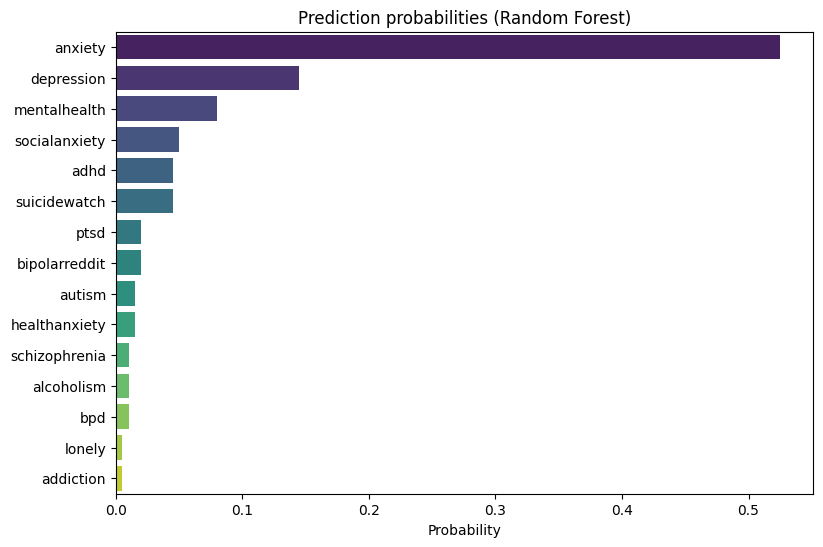


🔧 Random Forest chosen — showing feature importances (global + local) and LIME local explanation.

Top local input features (Random Forest):
  feel                      0.005748
  panic                     0.003924
  make                      0.002185
  thoughts                  0.001538
  sleep                     0.001294
  reason                    0.001132
  okay                      0.000664
  lately                    0.000635
  small                     0.000577
  mood                      0.000532


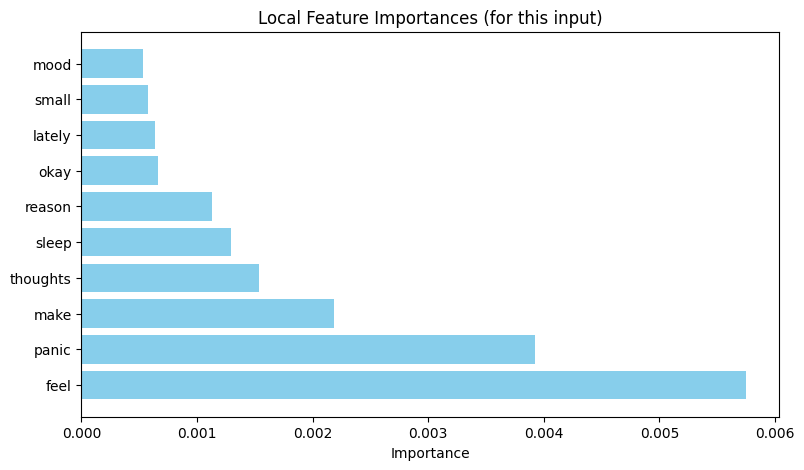


Top global features (Random Forest):
  adhd                      0.025384
  anxiety                   0.025280
  depression                0.014550
  bpd                       0.013695
  depressed                 0.006768
  just                      0.006296
  anxious                   0.006222
  lonely                    0.006219
  social                    0.006021
  suicide                   0.006003
  life                      0.005836
  feel                      0.005748
  kill                      0.005678
  want                      0.005312
  don                       0.005300
  autism                    0.005104
  like                      0.004933
  die                       0.004931
  ptsd                      0.004590
  friends                   0.004481
  mental                    0.004325
  know                      0.004116
  panic                     0.003924
  people                    0.003920
  adderall                  0.003827


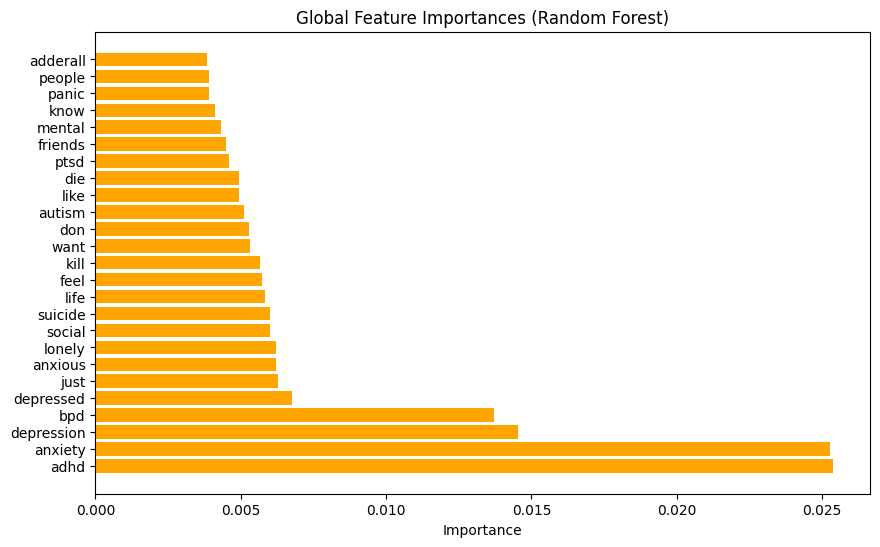


🌿 LIME (top contributions):
  panic                          -0.0268
  thoughts                       +0.0129
  suddenly                       +0.0113
  racing                         +0.0089
  feel                           +0.0071
  make                           +0.0066
  reason                         -0.0052
  small                          +0.0046
  Lately                         -0.0036
  mood                           -0.0029


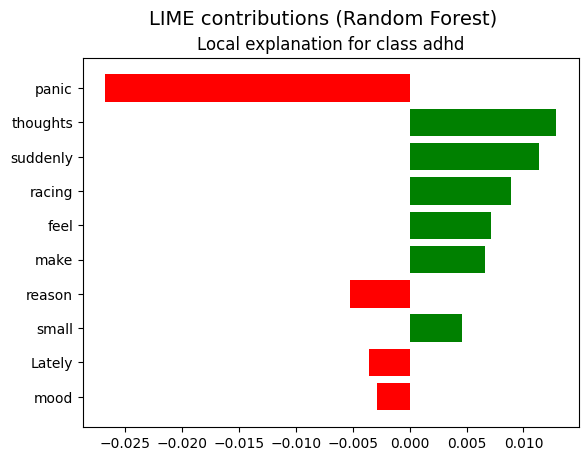


Summary: Random Forest explained via feature importances (global + local) and LIME.


In [18]:
text_input = """Lately I can’t sleep, my thoughts keep racing, and even small noises make me panic. Sometimes I feel okay, but then suddenly my mood drops for no reason."""
explain_prediction(text_input)

🔎 Input (trim): 
Over the past few months, I have been feeling an increasing sense of anxiety and unease. 
Simple daily activities, such as getting out of bed, responding to messages, or preparing meals, 
have become overwhelming tasks. I struggle to conce...
✅ Best Model Selected: Logistic Regression
🎯 Predicted Condition: anxiety  (confidence: 0.869)

Top probabilities (model order):
  anxiety             : 0.8693 <-- predicted
  mentalhealth        : 0.0553 
  depression          : 0.0315 
  adhd                : 0.0152 
  healthanxiety       : 0.0064 
  socialanxiety       : 0.0063 
  ptsd                : 0.0044 
  suicidewatch        : 0.0034 
  schizophrenia       : 0.0016 
  autism              : 0.0015 


C:\Users\ankit\AppData\Local\Temp\ipykernel_18612\3192086864.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=best_probs[sorted_idx], y=[class_mapping[int(best_model.classes_[i])] for i in sorted_idx], palette="viridis")


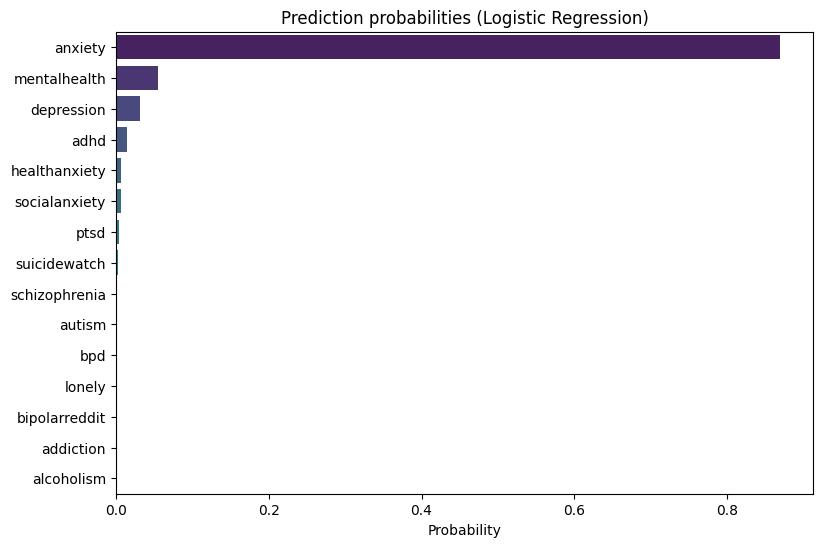


🔧 Model is linear (Logistic Regression or Linear SVM): attempting SHAP and LIME.
⚠️ SHAP failed; using linear coefficients * input value fallback. Reason: list indices must be integers or slices, not str

Fallback local contributions:
  anxiety                   +1.017563
  anxious                   +0.761375
  worrying                  +0.472158
  worry                     +0.354524
  tension                   +0.276000
  chest                     +0.270892
  social                    -0.260450
  tightness                 +0.236932
  racing                    +0.234834
  unsure                    +0.218045

🌿 LIME top contributions:
  anxiety                        -0.0534
  anxious                        -0.0357
  worrying                       -0.0293
  worry                          -0.0227
  chest                          -0.0213
  frustrated                     +0.0204
  tasks                          +0.0198
  manage                         +0.0171
  satisfaction               

In [23]:
text_input = """
Over the past few months, I have been feeling an increasing sense of anxiety and unease. 
Simple daily activities, such as getting out of bed, responding to messages, or preparing meals, 
have become overwhelming tasks. I struggle to concentrate at work, and I often feel mentally exhausted 
by midday. Sleep has become irregular—I either lie awake worrying for hours or wake up multiple times during the night. 
I notice that I avoid social gatherings and have started withdrawing from friends and family. 
Hobbies and activities I used to enjoy no longer bring me satisfaction. 
Physical symptoms, such as a racing heartbeat, tightness in my chest, and tension headaches, 
often accompany my anxious thoughts. I frequently ruminate over past events and worry excessively about the future, 
feeling hopeless and unsure of how to manage even basic responsibilities. 
These feelings leave me drained, frustrated, and increasingly isolated, creating a cycle that I find difficult to break.
"""
explain_prediction(text_input)

Input (trim): 
I often find myself unable to focus on a single task for long periods. 
Even when something is important, I get distracted easily by noises, thoughts, or messages on my phone. 
I start projects but rarely finish them, and I forget deadlines or appointments. 
...
Best model: Logistic Regression
Predicted: adhd  (confidence = 0.9940)

Top probabilities (model order):
  adhd                      0.9940 <-- predicted
  anxiety                   0.0015 
  mentalhealth              0.0014 
  depression                0.0013 
  bpd                       0.0005 
  autism                    0.0005 
  schizophrenia             0.0002 
  lonely                    0.0001 
  ptsd                      0.0001 
  suicidewatch              0.0001 


C:\Users\ankit\AppData\Local\Temp\ipykernel_18612\613468658.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=best_probs[order], y=[class_mapping[int(best_model.classes_[i])] for i in order], palette="viridis")


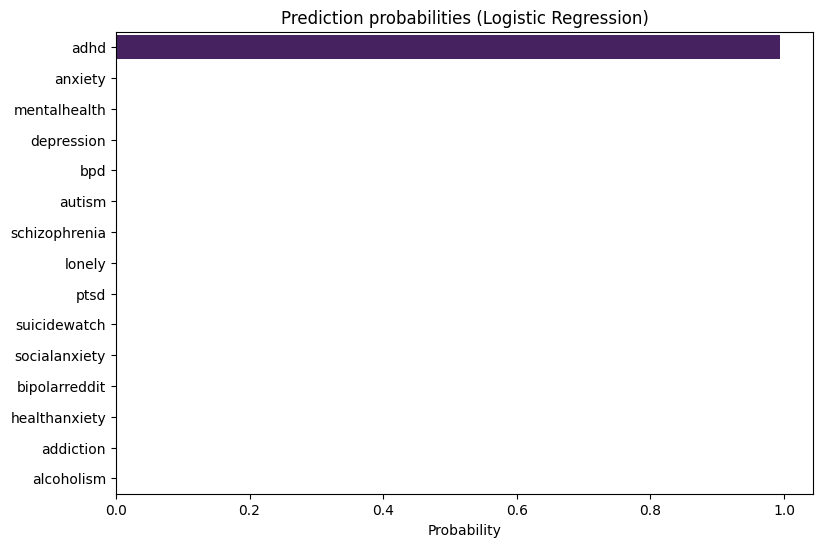


-- Linear model branch (Logistic Regression / Linear SVM). Using exact linear contributions + LIME.

Top local contributions (feature: contribution) — exact for linear model:
  distracted                     +0.986731
  impulsively                    +0.705277
  focus                          +0.636240
  task                           +0.609720
  deadlines                      +0.608823
  finish                         +0.569081
  organize                       +0.535979
  forget                         +0.505988
  projects                       +0.268262
  phone                          +0.243234
  thoughts                       -0.223254
  important                      +0.217360


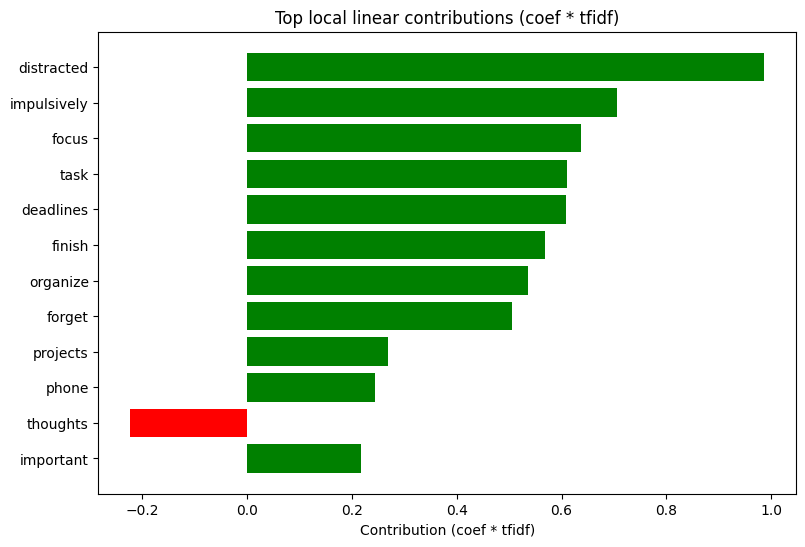


LIME top contributions (word, weight):
  distracted                     +0.0635
  impulsively                    +0.0433
  focus                          +0.0424
  thoughts                       -0.0372
  task                           +0.0371
  finish                         +0.0351
  organize                       +0.0346
  deadlines                      +0.0340
  forget                         +0.0297
  phone                          +0.0131
  feel                           -0.0129
  important                      +0.0121


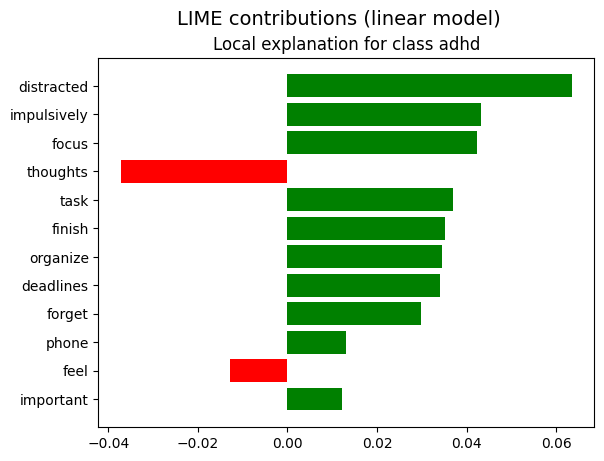


Global top features (model-level):
  anxiety                        5.840959
  depression                     4.782078
  bpd                            4.180628
  adhd                           3.918345
  ptsd                           3.070202
  depressed                      3.005813
  suicide                        2.990858
  diagnosed                      2.822144
  anxious                        2.816387
  schizophrenia                  2.689982
  suicidal                       2.516155
  kill                           2.495365
  autism                         2.489059
  bipolar                        2.472213
  dae                            2.404280
  fp                             2.349743
  addiction                      2.312355
  diagnosis                      2.209694
  meds                           2.141021
  sober                          2.110895
  sa                             2.109982
  mental                         2.059014
  health                         2.05640

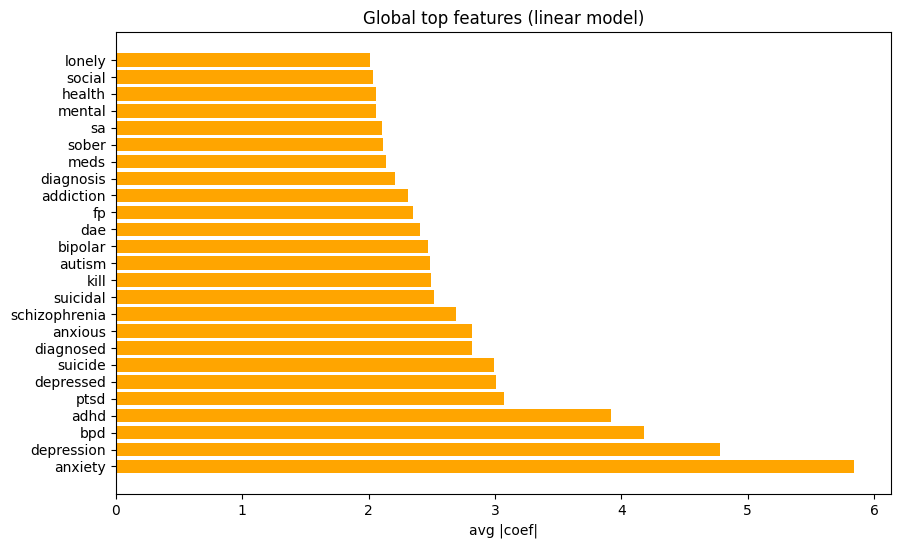


Summary: model decision was driven by words (LIME top): distracted, impulsively, focus, thoughts, task


In [25]:
text_input = """
I often find myself unable to focus on a single task for long periods. 
Even when something is important, I get distracted easily by noises, thoughts, or messages on my phone. 
I start projects but rarely finish them, and I forget deadlines or appointments. 
I feel restless and fidgety, tapping my hands or moving around when I should be sitting still. 
I impulsively say or do things without thinking, and it often gets me into trouble at work or school. 
Even when I try to organize myself, my thoughts jump quickly from one idea to another.
"""
explain_prediction(text_input)

Input (trim): 
Some days I feel unstoppable, energized, and overly confident, taking impulsive risks. 
Other days, I’m lethargic, hopeless, and unable to complete basic tasks. 
My mood swings unpredictably, leaving me exhausted and confused.

Best model: Logistic Regression
Predicted: adhd  (confidence = 0.3978)

Top probabilities (model order):
  adhd                      0.3978 <-- predicted
  bpd                       0.2970 
  depression                0.1191 
  mentalhealth              0.0917 
  suicidewatch              0.0332 
  bipolarreddit             0.0238 
  autism                    0.0062 
  anxiety                   0.0060 
  socialanxiety             0.0058 
  ptsd                      0.0049 


C:\Users\ankit\AppData\Local\Temp\ipykernel_18612\613468658.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=best_probs[order], y=[class_mapping[int(best_model.classes_[i])] for i in order], palette="viridis")


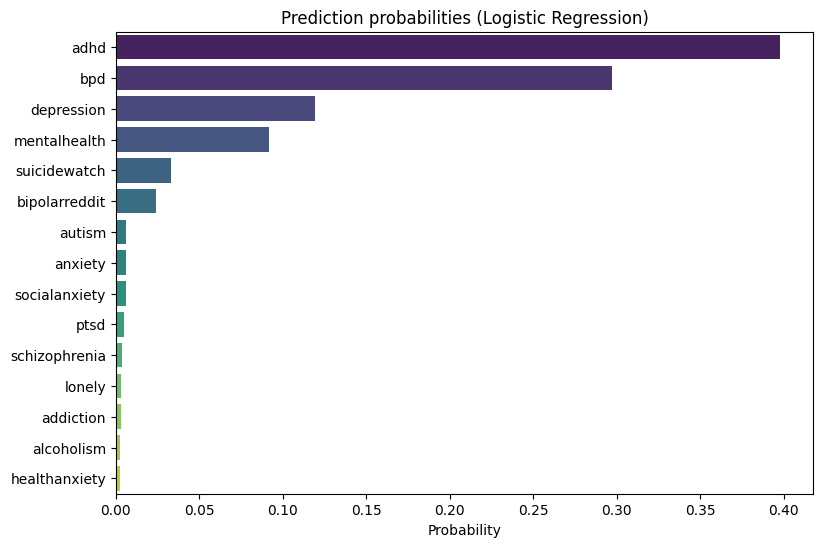


-- Linear model branch (Logistic Regression / Linear SVM). Using exact linear contributions + LIME.

Top local contributions (feature: contribution) — exact for linear model:
  impulsive                      +1.335549
  tasks                          +0.697583
  swings                         +0.214441
  complete                       +0.182188
  risks                          +0.167682
  taking                         +0.160564
  feel                           -0.149570
  lethargic                      -0.106509
  exhausted                      +0.103945
  confident                      -0.101502
  confused                       -0.099892
  days                           -0.099007


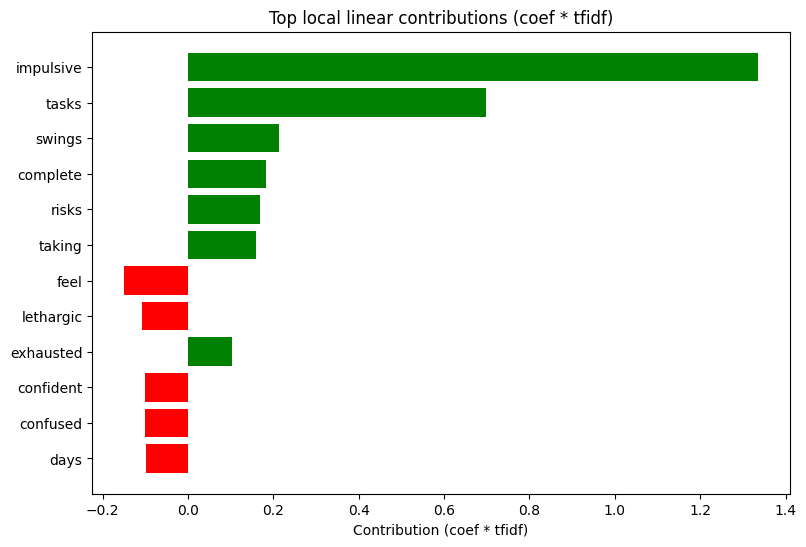


LIME top contributions (word, weight):
  impulsive                      +0.2888
  tasks                          +0.1735
  mood                           -0.0960
  feel                           -0.0635
  lethargic                      -0.0514
  confused                       -0.0447
  risks                          +0.0413
  taking                         +0.0411
  hopeless                       -0.0396
  leaving                        -0.0263
  days                           -0.0255
  basic                          -0.0241


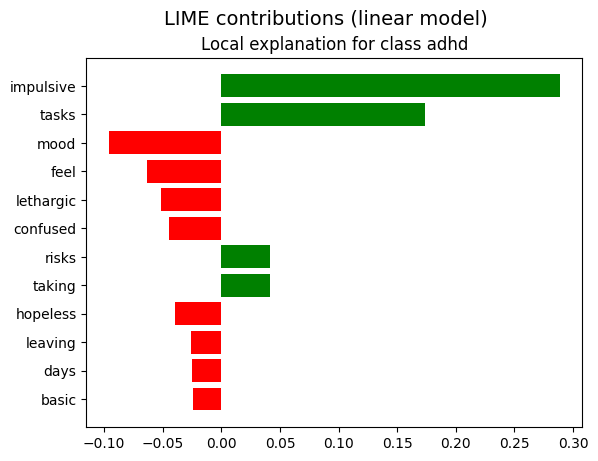


Global top features (model-level):
  anxiety                        5.840959
  depression                     4.782078
  bpd                            4.180628
  adhd                           3.918345
  ptsd                           3.070202
  depressed                      3.005813
  suicide                        2.990858
  diagnosed                      2.822144
  anxious                        2.816387
  schizophrenia                  2.689982
  suicidal                       2.516155
  kill                           2.495365
  autism                         2.489059
  bipolar                        2.472213
  dae                            2.404280
  fp                             2.349743
  addiction                      2.312355
  diagnosis                      2.209694
  meds                           2.141021
  sober                          2.110895
  sa                             2.109982
  mental                         2.059014
  health                         2.05640

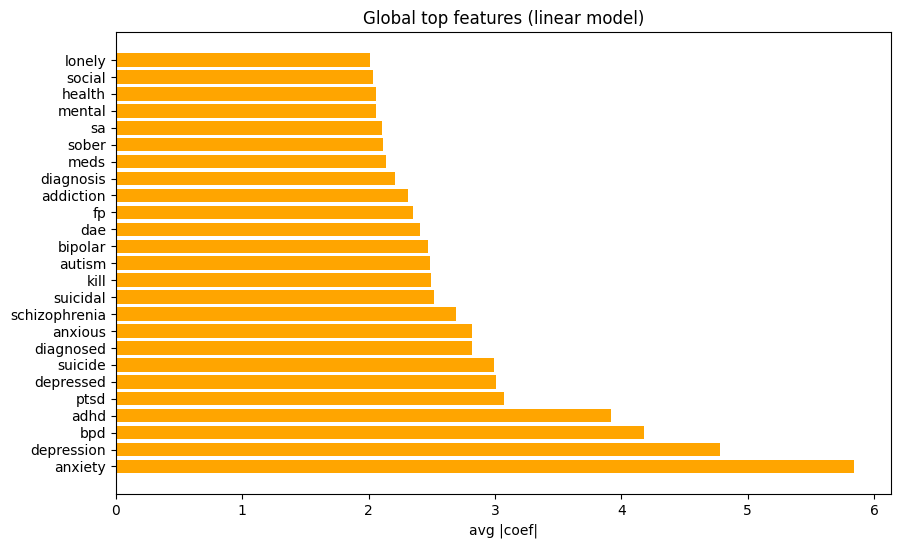


Summary: model decision was driven by words (LIME top): impulsive, tasks, mood, feel, lethargic


In [26]:
text_input = """
Some days I feel unstoppable, energized, and overly confident, taking impulsive risks. 
Other days, I’m lethargic, hopeless, and unable to complete basic tasks. 
My mood swings unpredictably, leaving me exhausted and confused.
"""
explain_prediction(text_input)

In [ ]:
#TREND ANALYSIS USING THE DATASET OF REDDIT POSTS 700K MENTAL HEALTH

In [1]:
import zipfile

zip_path = "mental-health-dataset.zip"
extract_path = "mental_health_data"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Dataset extracted successfully!")


Dataset extracted successfully!


In [27]:
# Cell 1: Import libraries
import pandas as pd
import numpy as np
import re
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter


In [28]:
# Cell 2: Load dataset
dataset_path = "mental_health_data/mental_disorders_reddit.csv"
df = pd.read_csv(dataset_path)

print("Dataset loaded successfully")
print("Shape of dataset:", df.shape)
print("Columns:", df.columns.tolist())


Dataset loaded successfully
Shape of dataset: (701787, 5)
Columns: ['title', 'selftext', 'created_utc', 'over_18', 'subreddit']


In [29]:
# Cell 3: Define preprocessing
def clean_text(text):
    if pd.isnull(text):
        return ""
    text = text.lower()
    text = re.sub(r"http\S+|www.\S+", "", text)   # remove urls
    text = re.sub(r"[^a-z\s]", "", text)          # remove punctuation/numbers
    text = re.sub(r"\s+", " ", text).strip()      # remove extra spaces
    return text

# Combine title + selftext
df["text"] = (df["title"].fillna("") + " " + df["selftext"].fillna("")).apply(clean_text)

print("🔹 New text column sample:\n", df["text"].head())


🔹 New text column sample:
 0    life is so pointless without others does anyon...
1    cold rage hello fellow friends im on the bpd s...
2    i dont know who i am my f bf m told me today a...
3    help opinions advice okay im about to open up ...
4                                         help removed
Name: text, dtype: object


In [30]:
# Cell 4: Load vectorizer and models
vectorizer = joblib.load("tfidf_vectorizer.pkl")
log_reg = joblib.load("logistic_regression_model.pkl")
svm = joblib.load("linear_svm_model.pkl")
rf = joblib.load("random_forest_model.pkl")
label_encoder = joblib.load("label_encoder.pkl")

print("✅ Vectorizer & Models loaded successfully")
print("Classes:", label_encoder.classes_)


c:\Users\ankit\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:442: InconsistentVersionWarning: Trying to unpickle estimator TfidfTransformer from version 1.7.0 when using version 1.7.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\ankit\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:442: InconsistentVersionWarning: Trying to unpickle estimator TfidfVectorizer from version 1.7.0 when using version 1.7.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\ankit\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:442: InconsistentVersionWarning: Trying to unpickle esti

✅ Vectorizer & Models loaded successfully
Classes: ['addiction' 'adhd' 'alcoholism' 'anxiety' 'autism' 'bipolarreddit' 'bpd'
 'depression' 'healthanxiety' 'lonely' 'mentalhealth' 'ptsd'
 'schizophrenia' 'socialanxiety' 'suicidewatch']


c:\Users\ankit\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:442: InconsistentVersionWarning: Trying to unpickle estimator RandomForestClassifier from version 1.7.0 when using version 1.7.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\ankit\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:442: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.7.0 when using version 1.7.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [31]:
# Cell 5: Vectorize text (may take time)
X = vectorizer.transform(df["text"])

print("✅ Vectorization complete")
print("Shape of vectorized data:", X.shape)


✅ Vectorization complete
Shape of vectorized data: (701787, 5000)


In [32]:
# Cell 6: Predictions from all models
print("🔄 Running predictions... (this may take time)")

pred_log = log_reg.predict(X)
pred_svm = svm.predict(X)
pred_rf  = rf.predict(X)

# Decode back to disease names
pred_log_labels = label_encoder.inverse_transform(pred_log)
pred_svm_labels = label_encoder.inverse_transform(pred_svm)
pred_rf_labels  = label_encoder.inverse_transform(pred_rf)

print("✅ Predictions complete")


🔄 Running predictions... (this may take time)
✅ Predictions complete


In [33]:
# Cell 8: Trend analysis with global + per-class explanations
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def trend_analysis(df, model, pred_labels, model_name):
    counts = Counter(pred_labels)
    total = sum(counts.values())
    percentages = {d: (n/total)*100 for d, n in counts.items()}
    
    # --- Pie Chart with Legend ---
    plt.figure(figsize=(8, 8))
    wedges, _, _ = plt.pie(
        counts.values(),
        autopct='%1.1f%%',
        startangle=140,
        colors=sns.color_palette("tab20")
    )
    
    plt.title(f"Overall Disease Trend - {model_name}", fontsize=14)
    plt.legend(
        wedges,
        [f"{d} ({n}, {percentages[d]:.1f}%)" for d, n in counts.items()],
        title="Disorders",
        loc="center left",
        bbox_to_anchor=(1, 0, 0.5, 1),
        fontsize=10
    )
    plt.show()
    
    # --- Bar Chart ---
    plt.figure(figsize=(12, 6))
    sns.barplot(
        x=list(counts.keys()), 
        y=list(counts.values()), 
        palette="tab20"
    )
    plt.xticks(rotation=45, ha="right")
    plt.ylabel("Number of Cases")
    plt.title(f"Cases per Disease - {model_name}")
    plt.show()
    
    # --- Global Explanation ---
    feature_names = vectorizer.get_feature_names_out()
    top_n = 15
    
    if hasattr(model, "coef_"):  # Logistic / SVM
        global_importances = np.mean(np.abs(model.coef_), axis=0)
    elif hasattr(model, "feature_importances_"):  # Random Forest
        global_importances = model.feature_importances_
    else:
        print("⚠️ No feature importances available for this model.")
        return
    
    top_idx = np.argsort(global_importances)[-top_n:]
    top_features = feature_names[top_idx]
    top_values = global_importances[top_idx]
    
    # Global Bar Plot
    plt.figure(figsize=(10, 6))
    plt.barh(top_features, top_values, color="skyblue")
    plt.xlabel("Importance / Contribution")
    plt.title(f"Top {top_n} Features Driving Predictions - {model_name} (Global)")
    plt.show()
    
    print("\n🔍 Global Explanation Summary:")
    for feat, val in zip(top_features[::-1], top_values[::-1]):
        print(f" - {feat}: {val:.4f}")
    
    # --- Per-Class Explanation ---
    print(f"\n📑 Top Features Per Class ({model_name}):")
    if hasattr(model, "coef_"):  # Logistic Regression / SVM
        for i, cls in enumerate(model.classes_):
            class_importances = np.abs(model.coef_[i])
            top_idx_cls = np.argsort(class_importances)[-top_n:]
            top_feats_cls = feature_names[top_idx_cls]
            top_vals_cls = class_importances[top_idx_cls]
            
            print(f"\n🔹 {label_encoder.inverse_transform([cls])[0]}:")
            for feat, val in zip(top_feats_cls[::-1], top_vals_cls[::-1]):
                print(f"   - {feat}: {val:.4f}")
    
    elif hasattr(model, "feature_importances_"):  # Random Forest
        print("Random Forest does not provide per-class feature importances directly.")
        print("Using global feature importances instead.")


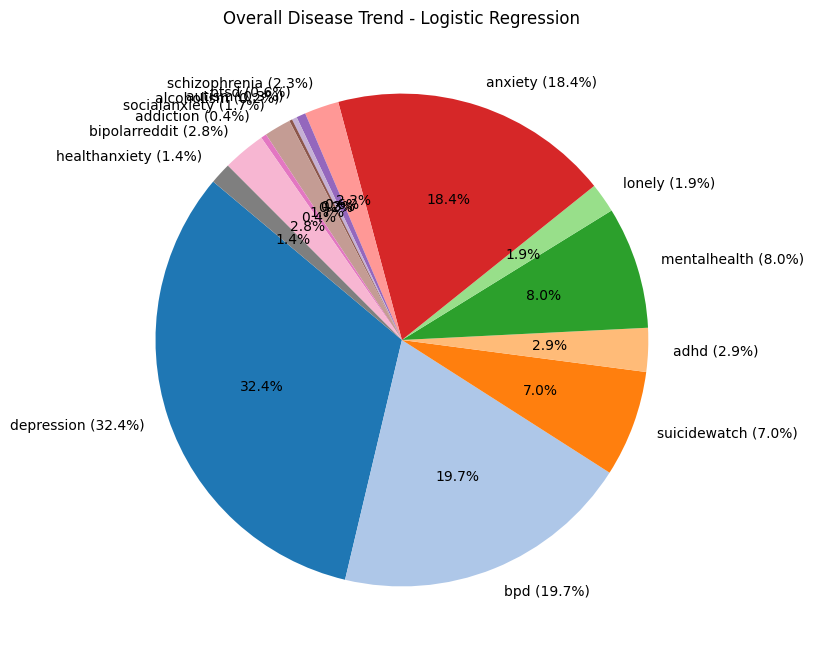

C:\Users\ankit\AppData\Local\Temp\ipykernel_18612\3773699251.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(counts.keys()), y=list(counts.values()), palette="tab20")


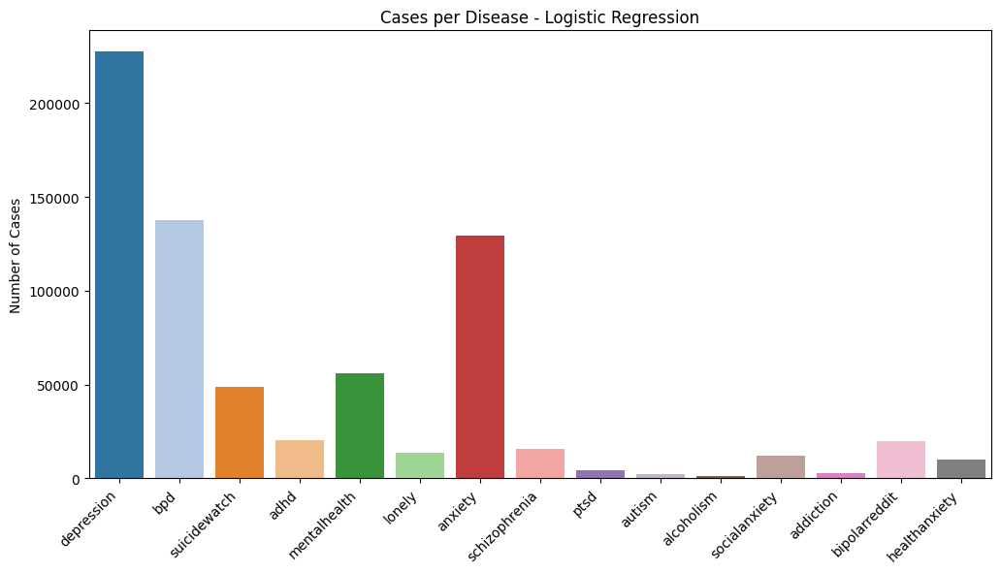


📊 Disease Trend Analysis (Logistic Regression):
 - depression: 227411 cases (32.40%)
 - bpd: 137947 cases (19.66%)
 - suicidewatch: 48954 cases (6.98%)
 - adhd: 20127 cases (2.87%)
 - mentalhealth: 56236 cases (8.01%)
 - lonely: 13662 cases (1.95%)
 - anxiety: 129192 cases (18.41%)
 - schizophrenia: 15862 cases (2.26%)
 - ptsd: 4234 cases (0.60%)
 - autism: 2316 cases (0.33%)
 - alcoholism: 1391 cases (0.20%)
 - socialanxiety: 12275 cases (1.75%)
 - addiction: 2565 cases (0.37%)
 - bipolarreddit: 19763 cases (2.82%)
 - healthanxiety: 9852 cases (1.40%)


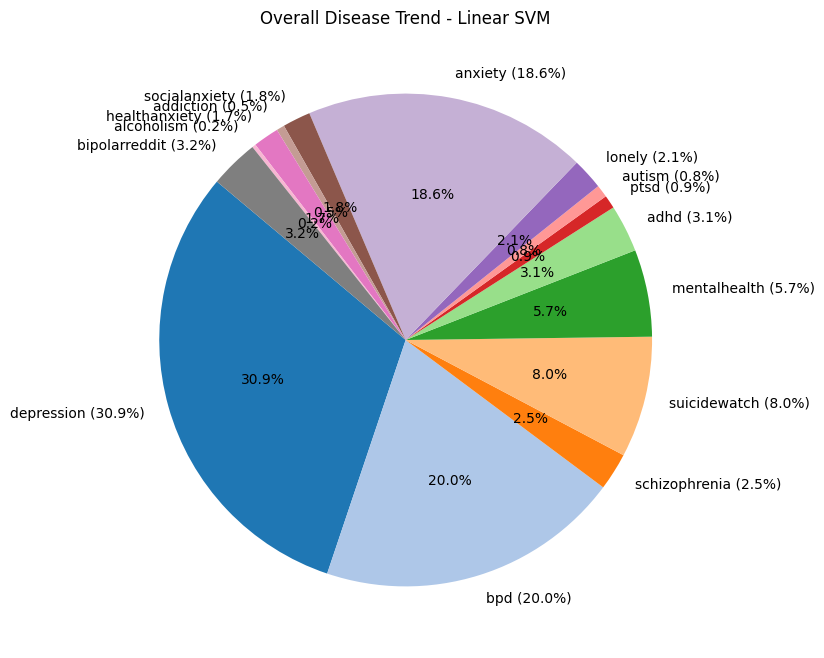

C:\Users\ankit\AppData\Local\Temp\ipykernel_18612\3773699251.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(counts.keys()), y=list(counts.values()), palette="tab20")


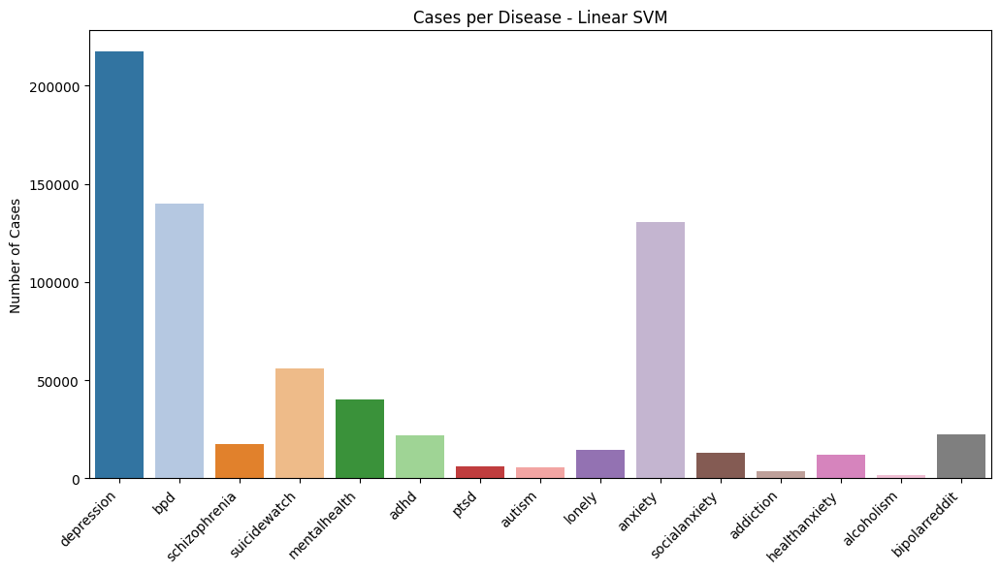


📊 Disease Trend Analysis (Linear SVM):
 - depression: 217201 cases (30.95%)
 - bpd: 140080 cases (19.96%)
 - schizophrenia: 17254 cases (2.46%)
 - suicidewatch: 55839 cases (7.96%)
 - mentalhealth: 40107 cases (5.71%)
 - adhd: 21830 cases (3.11%)
 - ptsd: 6107 cases (0.87%)
 - autism: 5753 cases (0.82%)
 - lonely: 14425 cases (2.06%)
 - anxiety: 130601 cases (18.61%)
 - socialanxiety: 12849 cases (1.83%)
 - addiction: 3682 cases (0.52%)
 - healthanxiety: 11842 cases (1.69%)
 - alcoholism: 1721 cases (0.25%)
 - bipolarreddit: 22496 cases (3.21%)


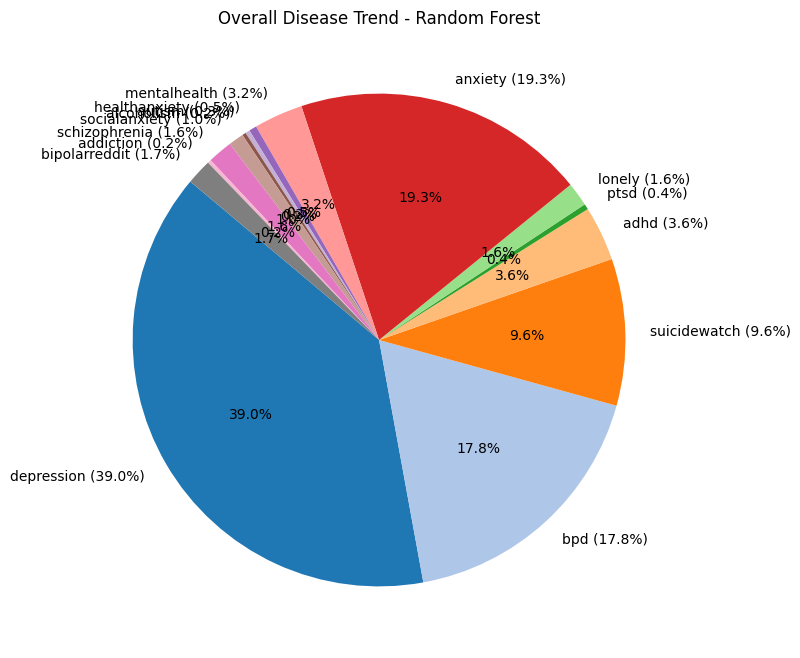

C:\Users\ankit\AppData\Local\Temp\ipykernel_18612\3773699251.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(counts.keys()), y=list(counts.values()), palette="tab20")


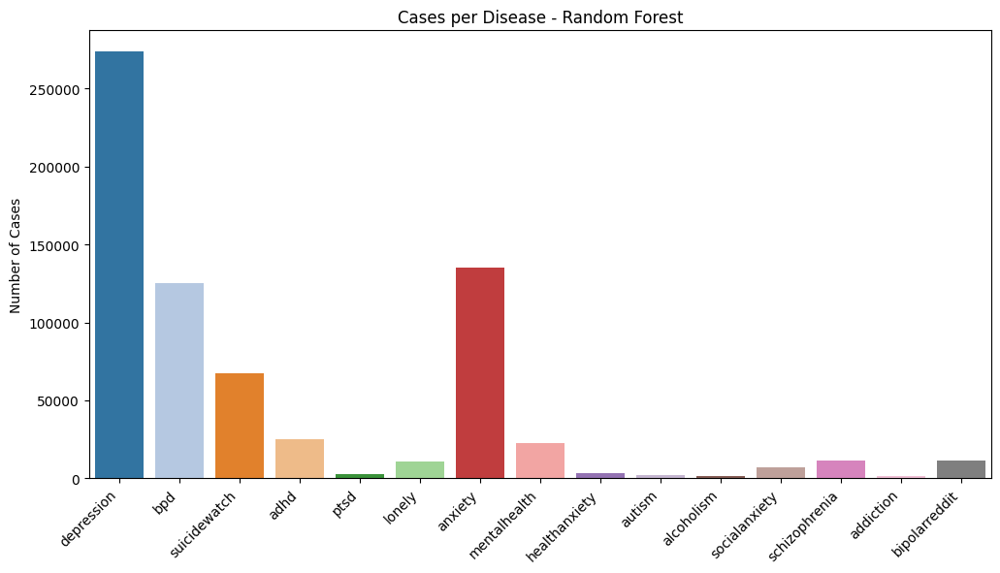


📊 Disease Trend Analysis (Random Forest):
 - depression: 273606 cases (38.99%)
 - bpd: 125097 cases (17.83%)
 - suicidewatch: 67565 cases (9.63%)
 - adhd: 25173 cases (3.59%)
 - ptsd: 2533 cases (0.36%)
 - lonely: 11000 cases (1.57%)
 - anxiety: 135169 cases (19.26%)
 - mentalhealth: 22556 cases (3.21%)
 - healthanxiety: 3528 cases (0.50%)
 - autism: 2055 cases (0.29%)
 - alcoholism: 1683 cases (0.24%)
 - socialanxiety: 7014 cases (1.00%)
 - schizophrenia: 11439 cases (1.63%)
 - addiction: 1638 cases (0.23%)
 - bipolarreddit: 11731 cases (1.67%)


In [36]:
# Cell 8: Trend analysis (overall distribution)

def trend_analysis(pred_labels, model_name):
        
    counts = Counter(pred_labels)
    total = sum(counts.values())
    percentages = {d: (n/total)*100 for d, n in counts.items()}
    
    # Pie chart
    plt.figure(figsize=(8, 8))
    plt.pie(counts.values(),
            labels=[f"{d} ({p:.1f}%)" for d, p in percentages.items()],
            autopct='%1.1f%%',
            startangle=140,
            colors=sns.color_palette("tab20"))
    plt.title(f"Overall Disease Trend - {model_name}")
    plt.show()
    
    # Bar chart
    plt.figure(figsize=(12, 6))
    sns.barplot(x=list(counts.keys()), y=list(counts.values()), palette="tab20")
    plt.xticks(rotation=45, ha="right")
    plt.ylabel("Number of Cases")
    plt.title(f"Cases per Disease - {model_name}")
    plt.show()
    
    # Text summary
    print(f"\n📊 Disease Trend Analysis ({model_name}):")
    for d, n in counts.items():
        print(f" - {d}: {n} cases ({percentages[d]:.2f}%)")

# Run clean trend analysis for each model
trend_analysis(pred_log_labels, "Logistic Regression")
trend_analysis(pred_svm_labels, "Linear SVM")
trend_analysis(pred_rf_labels, "Random Forest")



Random Forest Report (Time: 3149.93s):
               precision    recall  f1-score   support

    addiction       0.78      0.70      0.74      1528
         adhd       0.85      0.83      0.84      9126
   alcoholism       0.76      0.82      0.79      1182
      anxiety       0.69      0.71      0.70     11534
       autism       0.86      0.74      0.80      1774
bipolarreddit       0.70      0.46      0.55      1156
          bpd       0.89      0.62      0.73      4859
   depression       0.50      0.76      0.60     23466
healthanxiety       0.80      0.55      0.65      1730
       lonely       0.67      0.49      0.57      4727
 mentalhealth       0.69      0.31      0.43      9067
         ptsd       0.78      0.61      0.69      1729
schizophrenia       0.74      0.62      0.68      1742
socialanxiety       0.74      0.58      0.65      4599
 suicidewatch       0.62      0.55      0.58     13232

     accuracy                           0.64     91451
    macro avg       0.7

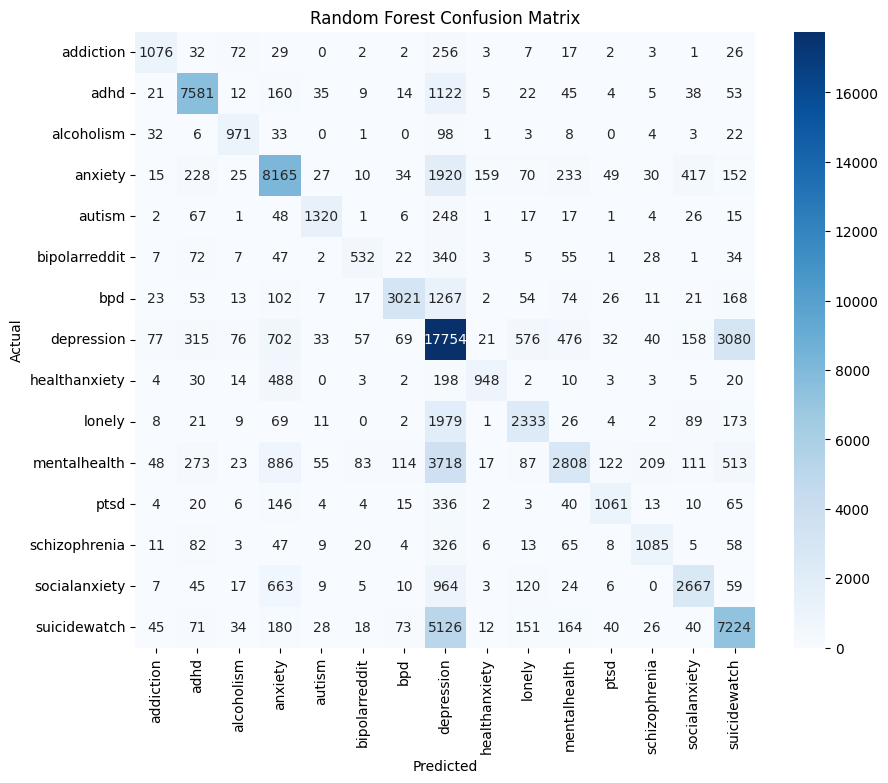

0.6401898284327125

In [ ]:
rf = RandomForestClassifier(
    n_estimators=200,
    n_jobs=-1,
    random_state=42,

    class_weight='balanced',
    max_features='sqrt'   # reduces runtime on high-dimensional data
)
#train_evaluate(rf, X_train_vec, X_test_vec, "Random Forest")

